<a href="https://colab.research.google.com/github/ammaster10s/Year3/blob/main/U_NET_Modify_11_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
dir_path ='/content/drive/MyDrive/Working/val/CNV'

count = 0
# Iterate directory
for path in os.listdir(dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(dir_path, path)):
        count += 1
print('File count:', count)

File count: 242


In [ ]:
import json

# Path to your COCO JSON file
coco_json_path = '/content/merged_coco.json'

# Function to count total annotations in a COCO JSON file
def count_total_annotations(coco_json_file):
    # Load the COCO JSON file
    with open(coco_json_file, 'r') as f:
        coco_data = json.load(f)

    # Count the number of annotations
    total_annotations = len(coco_data['annotations'])

    return total_annotations


total_annotations = count_total_annotations(coco_json_path)

# Total Result
print(f"Total number of annotated items: {total_annotations}")


Merge COCO label

In [ ]:
# pip install pycocotools
from pycocotools.coco import COCO
import json

def merge_coco_json(json_files, output_file):
    merged_annotations = {
        "info": {},
        "licenses": [],
        "images": [],
        "annotations": [],
        "categories": []
    }

    image_id_offset = 0
    annotation_id_offset = 0
    category_id_offset = 0
    existing_category_ids = set()

    for idx, file in enumerate(json_files):
        coco = COCO(file)

        # Update image IDs to avoid conflicts
        for image in coco.dataset['images']:
            image['id'] += image_id_offset
            merged_annotations['images'].append(image)

        # Update annotation IDs to avoid conflicts
        for annotation in coco.dataset['annotations']:
            annotation['id'] += annotation_id_offset
            annotation['image_id'] += image_id_offset
            merged_annotations['annotations'].append(annotation)

        # Update categories and their IDs to avoid conflicts
        for category in coco.dataset['categories']:
            if category['id'] not in existing_category_ids:
                category['id'] += category_id_offset
                merged_annotations['categories'].append(category)
                existing_category_ids.add(category['id'])

        image_id_offset = len(merged_annotations['images'])
        annotation_id_offset = len(merged_annotations['annotations'])
        category_id_offset = len(merged_annotations['categories'])

    # Save merged annotations to output file
    with open(output_file, 'w') as f:
        json.dump(merged_annotations, f)

# List of paths to COCO JSON files to merge
json_files = ["/content/drive/MyDrive/Working/train/CNV500.json", "/content/drive/MyDrive/Working/train/instances_default.json"]

# Output file path for merged annotations
output_file = "merged_coco.json"

# Merge COCO JSON files
merge_coco_json(json_files, output_file)

print("Merged COCO JSON files saved to", output_file)

loading annotations into memory...
Done (t=1.53s)
creating index...
index created!
loading annotations into memory...
Done (t=0.67s)
creating index...
index created!
Merged COCO JSON files saved to merged_coco.json


In [ ]:
%%capture
!pip install numpy
!pip install opencv-python
!pip install glob2
!pip install tensorflow
!pip install keras
!pip install scikit-learn
!pip install matplotlib
!pip install pandas==1.5.3
!pip install scikit-image --quiet
!pip show Pillow

In [ ]:
import os
import numpy as np
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
from skimage import exposure
from skimage.util import random_noise
from sklearn.metrics import f1_score
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger

# Extract COCO label combine with Pictures

In [ ]:
%%capture
import os
import json
import numpy as np
from pycocotools.mask import decode
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image, ImageDraw
from pycocotools import mask as maskUtils

# Function to handle both RLE and polygon segmentation formats in COCO
def segmentation_to_mask(segmentation, width, height):
    if isinstance(segmentation, dict):  # RLE format (compressed RLE)
        print("Decoding RLE mask")
        rle = maskUtils.frPyObjects(segmentation, height, width)
        mask = maskUtils.decode(rle)
        return mask
    elif isinstance(segmentation, list):  # Polygon format
        print("Processing polygon mask")
        mask = np.zeros((height, width), dtype=np.uint8)
        # Create a binary mask from polygons
        for polygon in segmentation:
            poly = np.array(polygon).reshape((-1, 2))
            img = Image.new('L', (width, height), 0)
            ImageDraw.Draw(img).polygon([tuple(p) for p in poly], outline=1, fill=1)
            mask = np.array(img, dtype=np.uint8)
        return mask
    else:
        raise TypeError("Unsupported segmentation format")

# Function to parse the COCO JSON file and return annotations
def parse_coco_json(json_file, image_dir):
    with open(json_file, 'r') as f:
        coco_data = json.load(f)

    annotations = []
    image_data = {}

    # Map image ID to file name and other metadata
    for img_info in coco_data['images']:
        image_data[img_info['id']] = {
            'file_name': img_info['file_name'],
            'width': img_info['width'],
            'height': img_info['height']
        }

    # Extract segmentation and mask information
    for ann in coco_data['annotations']:
        image_id = ann['image_id']
        image_info = image_data[image_id]
        image_filename = image_info['file_name']
        width = image_info['width']
        height = image_info['height']

        # Get the segmentation mask (COCO format supports RLE or polygons)
        mask = segmentation_to_mask(ann['segmentation'], width, height)

        annotations.append((image_filename, mask))

    return annotations

# Load image data and their masks, skip if no mask available
def load_data_with_masks(image_dir, annotation_file, target_size=(256, 256)):
    annotations = parse_coco_json(annotation_file, image_dir)
    images, masks = [], []

    for image_filename, mask in annotations:
        image_path = os.path.join(image_dir, image_filename)
        if mask is not None:
            # Load image
            img = img_to_array(load_img(image_path, color_mode='grayscale', target_size=target_size))
            images.append(img)

            # Resize mask to target size and append
            mask_resized = np.array(Image.fromarray(mask).resize(target_size, Image.NEAREST))
            masks.append(mask_resized)
        else:
            print(f"Skipping {image_filename} due to invalid or missing mask")

    if len(images) == 0:
        print("No valid images and masks were loaded!")
    return np.array(images), np.array(masks)

# Paths to your dataset (Images and COCO annotations)
train_image_dir = '/content/drive/MyDrive/Working/train/CNV'
train_json_annotation_file = '/content/merged_coco.json'  # Training JSON file
val_image_dir = '/content/drive/MyDrive/Working/val/CNV35'
val_json_annotation_file = '/content/drive/MyDrive/Working/val/instances_default.json'  # Validation JSON file

# Load the images and masks for training and validation
X_train, Y_train = load_data_with_masks(train_image_dir, train_json_annotation_file, target_size=(256, 256))
X_val, Y_val = load_data_with_masks(val_image_dir, val_json_annotation_file, target_size=(256, 256))

# Check if there are valid data loaded
if X_train.shape[0] == 0 or Y_train.shape[0] == 0:
    raise ValueError("Training data is empty. Check your annotations and images.")
if X_val.shape[0] == 0 or Y_val.shape[0] == 0:
    raise ValueError("Validation data is empty. Check your annotations and images.")

# Shuffle the training dataset (important!)
train_indices = np.arange(X_train.shape[0])
np.random.shuffle(train_indices)
X_train = X_train[train_indices]
Y_train = Y_train[train_indices]

# Shuffle the validation dataset
val_indices = np.arange(X_val.shape[0])
np.random.shuffle(val_indices)
X_val = X_val[val_indices]
Y_val = Y_val[val_indices]

# Normalize pixel values to 0-1 range for images
X_train = X_train / 255.0
X_val = X_val / 255.0

# Normalize masks (convert them to binary 0/1 masks)
Y_train = (Y_train > 0).astype(np.uint8)
Y_val = (Y_val > 0).astype(np.uint8)

# Generate augmented images for training
train_datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

# No augmentation for validation, only rescale images
val_datagen = ImageDataGenerator()

# Create training and validation generators
train_gen = train_datagen.flow(X_train, Y_train, batch_size=4)
val_gen = val_datagen.flow(X_val, Y_val, batch_size=4)






# Preview Masking

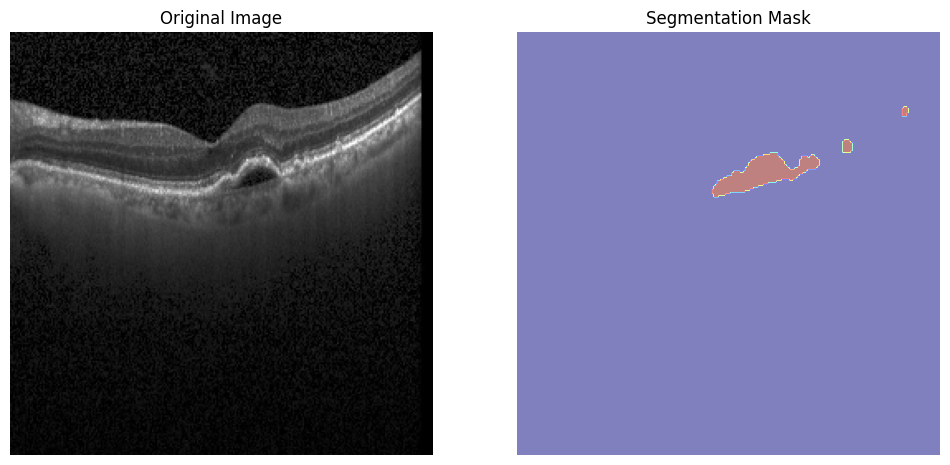

In [ ]:
import matplotlib.pyplot as plt

def plot_image_and_mask(image, mask):
    # Create a figure with two subplots
    plt.figure(figsize=(12, 6))

    # Display the original image
    plt.subplot(1, 2, 1)
    plt.imshow(image.squeeze(), cmap='gray')  # Use cmap='gray' for grayscale images
    plt.title('Original Image')
    plt.axis('off')  # Turn off axis labels

    # Display the mask
    plt.subplot(1, 2, 2)
    plt.imshow(mask.squeeze(), cmap='jet', alpha=0.5)  # Use alpha to overlay
    plt.title('Segmentation Mask')
    plt.axis('off')  # Turn off axis labels

    plt.show()


index = 422
plot_image_and_mask(X_train[index], Y_train[index])


# Setting training Parameters
# Outdated Method

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load image data and assign binary labels
def load_data(image_dir, label, target_size=(256, 256)):
    image_filenames = sorted(os.listdir(image_dir))
    images = [img_to_array(load_img(os.path.join(image_dir, img), color_mode='grayscale', target_size=target_size)) for img in image_filenames]
    labels = [label] * len(images)  # Assign the same label to all images in the folder
    return np.array(images), np.array(labels)

# Paths to your dataset (Images only, no masks)
nv_images_path = '/content/drive/MyDrive/Working/train/CNV'  # NV patches
non_nv_images_path = '/content/drive/MyDrive/Working/train/NORMAL'  # Non-NV patches

# Load training and validation data with labels
X_nv_train, Y_nv_train = load_data(nv_images_path, label=1, target_size=(256, 256))  # NV regions (Class 1)
X_non_nv_train, Y_non_nv_train = load_data(non_nv_images_path, label=0, target_size=(256, 256))  # Non-NV regions (Class 0)

# Combine NV and Non-NV datasets
X_train = np.concatenate((X_nv_train, X_non_nv_train), axis=0)
Y_train = np.concatenate((Y_nv_train, Y_non_nv_train), axis=0)

# Shuffle the dataset (important!)
indices = np.arange(X_train.shape[0])
np.random.shuffle(indices)
X_train = X_train[indices]
Y_train = Y_train[indices]

# Normalize pixel values to 0-1 range
X_train = X_train / 255.0

# Generate augmented images for training
datagen = ImageDataGenerator(
    rotation_range=25,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_gen = datagen.flow(X_train, Y_train, batch_size=4)


# U-Net Arch

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model

def unet_nv_localization(input_size=(256, 256, 1)):

    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck layer
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder with Attention Gates
    up6 = Conv2DTranspose(512, 2, strides=(2, 2), padding='same')(conv5)
    merge6 = concatenate([up6, conv4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(conv6)
    merge7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv7)
    merge8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv8)
    merge9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    # Output layer (Sigmoid activation for binary mask)
    output = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=inputs, outputs=output)

    return model

# Instantiate and compile the Attention U-Net model
model = unet_nv_localization(input_size=(256, 256, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model summary (optional)
# attn_unet_model.summary()


# Attention U-NET

In [ ]:
# https://github.com/bnsreenu/python_for_microscopists/blob/master/224_225_226_models.py#L78

def Attention_UNet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):
    FILTER_NUM = 32  # number of filters for the first layer
    FILTER_SIZE = 3  # size of the convolutional filter
    UP_SAMP_SIZE = 2  # size of upsampling filters

    inputs = layers.Input(input_shape, dtype=tf.float32)

    # Encoder path
    conv1 = conv_block(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, FILTER_SIZE, 2 * FILTER_NUM, dropout_rate, batch_norm)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, FILTER_SIZE, 4 * FILTER_NUM, dropout_rate, batch_norm)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = conv_block(pool3, FILTER_SIZE, 8 * FILTER_NUM, dropout_rate, batch_norm)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = conv_block(pool4, FILTER_SIZE, 16 * FILTER_NUM, dropout_rate, batch_norm)

    # Decoder path with attention
    gating_4 = gating_signal(conv5, 8 * FILTER_NUM, batch_norm)
    attn_4 = attention_block(conv4, gating_4, 8 * FILTER_NUM)
    up4 = UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE))(conv5)
    up4 = concatenate([up4, attn_4], axis=3)
    up_conv4 = conv_block(up4, FILTER_SIZE, 8 * FILTER_NUM, dropout_rate, batch_norm)

    gating_3 = gating_signal(up_conv4, 4 * FILTER_NUM, batch_norm)
    attn_3 = attention_block(conv3, gating_3, 4 * FILTER_NUM)
    up3 = UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE))(up_conv4)
    up3 = concatenate([up3, attn_3], axis=3)
    up_conv3 = conv_block(up3, FILTER_SIZE, 4 * FILTER_NUM, dropout_rate, batch_norm)

    gating_2 = gating_signal(up_conv3, 2 * FILTER_NUM, batch_norm)
    attn_2 = attention_block(conv2, gating_2, 2 * FILTER_NUM)
    up2 = UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE))(up_conv3)
    up2 = concatenate([up2, attn_2], axis=3)
    up_conv2 = conv_block(up2, FILTER_SIZE, 2 * FILTER_NUM, dropout_rate, batch_norm)

    gating_1 = gating_signal(up_conv2, FILTER_NUM, batch_norm)
    attn_1 = attention_block(conv1, gating_1, FILTER_NUM)
    up1 = UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE))(up_conv2)
    up1 = concatenate([up1, attn_1], axis=3)
    up_conv1 = conv_block(up1, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)

    # Output layer
    conv_final = Conv2D(NUM_CLASSES, kernel_size=(1, 1), padding="same")(up_conv1)
    conv_final = Activation("sigmoid")(conv_final)  # Use "softmax" for multiple classes

    # Model integration
    model = models.Model(inputs, conv_final, name="Attention_UNet")
    return model

# Instantiate and compile the Attention U-Net model
model = Attention_UNet(input_shape=(256, 256, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model summary (optional)
# attn_unet_model.summary()

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, Activation, BatchNormalization


def repeat_elem(tensor, rep):
    # lambda function to repeat Repeats the elements of a tensor along an axis
    #by a factor of rep.
    # If tensor has shape (None, 256,256,3), lambda will return a tensor of shape
    #(None, 256,256,6), if specified axis=3 and rep=2.

     return layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3),
                          arguments={'repnum': rep})(tensor)

def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

# Getting the x signal to the same shape as the gating signal
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

# Getting the gating signal to the same number of filters as the inter_shape
    phi_g = layers.Conv2D(inter_shape, (1, 1), padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3),
                                 strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]),
                                 padding='same')(phi_g)  # 16

    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = repeat_elem(upsample_psi, shape_x[3])

    y = layers.multiply([upsample_psi, x])

    result = layers.Conv2D(shape_x[3], (1, 1), padding='same')(y)
    result_bn = layers.BatchNormalization()(result)
    return result_bn

def gating_signal(input, out_size, batch_norm=False):
    """
    resize the down layer feature map into the same dimension as the up layer feature map
    using 1x1 conv
    :return: the gating feature map with the same dimension of the up layer feature map
    """
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def conv_block(input, filter_size, num_filters, dropout_rate=0.0, batch_norm=True):
    # A convolutional block with optional batch normalization and dropout
    x = Conv2D(num_filters, (filter_size, filter_size), padding="same")(input)
    if batch_norm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(num_filters, (filter_size, filter_size), padding="same")(x)
    if batch_norm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    return x


# Check Dimension

In [82]:
print(X_train.shape)
print(model.input_shape)
# Should return same size , and 1 dimension


(423, 256, 256, 1)
(None, 256, 256, 1)


# Training

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Compile the model
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with input images and masks
history = model.fit(
    X_train, Y_train,  # Input: X_train (images), Output: Y_train (masks)
    epochs=100,
    batch_size=2,
    validation_data=(X_val, Y_val),  # Validation images and corresponding masks
    callbacks=[early_stopping]
)


Epoch 1/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 109s 263ms/step - accuracy: 0.8186 - loss: 0.5136 - val_accuracy: 0.9522 - val_loss: 0.3484
Epoch 2/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 66s 67ms/step - accuracy: 0.9712 - loss: 0.2498 - val_accuracy: 0.9575 - val_loss: 0.2770
Epoch 3/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.9758 - loss: 0.2060 - val_accuracy: 0.9668 - val_loss: 0.2037
Epoch 4/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.9792 - loss: 0.1781 - val_accuracy: 0.9726 - val_loss: 0.1719
Epoch 5/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - accuracy: 0.9785 - loss: 0.1589 - val_accuracy: 0.9591 - val_loss: 0.1911
Epoch 6/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - accuracy: 0.9818 - loss: 0.1371 - val_accuracy: 0.9700 - val_loss: 0.1501
Epoch 7/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.9806 - loss: 0.1243 - val_accuracy: 0.9759 - val_loss: 0.1225
Epoch 8/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - accuracy: 0.9822 - loss:

In [ ]:
def load_full_image(image_path, target_size=(256, 256)):
    full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
    full_image_array = img_to_array(full_image) / 255.0
    full_image_array = np.expand_dims(full_image_array, axis=0)
    return full_image_array

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


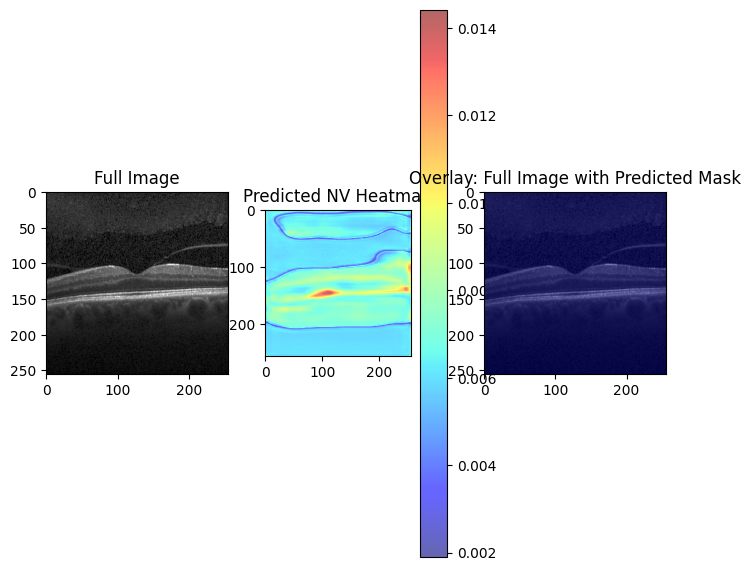

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# Path to the full image
full_image_path = '/content/drive/MyDrive/Working/val/NORMAL/NORMAL-1017237-1.jpeg'

# Predict the mask for the full image
full_image = load_full_image(full_image_path)
predicted_mask = model.predict(full_image)[0, :, :, 0]  # Get the predicted mask

# Apply threshold to the predicted mask for better visualization
threshold = 0.5
predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

# Plot the original image and predicted mask
plt.figure(figsize=(8, 8))

# Display the original full image
plt.subplot(1, 3, 1)
plt.imshow(np.squeeze(full_image), cmap='gray')
plt.title('Full Image')

# Display the predicted NV mask heatmap
plt.subplot(1, 3, 2)
plt.imshow(predicted_mask, cmap='jet', alpha=0.6)
plt.title('Predicted NV Heatmap')
plt.colorbar()

# Overlay predicted mask on the full image
plt.subplot(1, 3, 3)
plt.imshow(np.squeeze(full_image), cmap='gray')  # Original image
plt.imshow(predicted_mask_binary, cmap='jet', alpha=0.5)  # Predicted mask overlay
plt.title('Overlay: Full Image with Predicted Mask')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


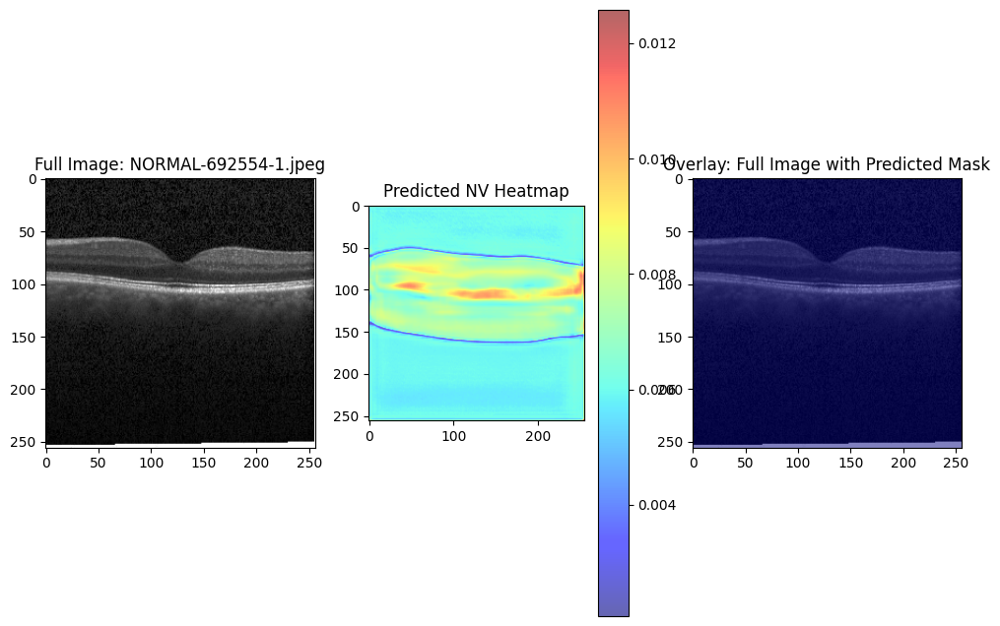

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


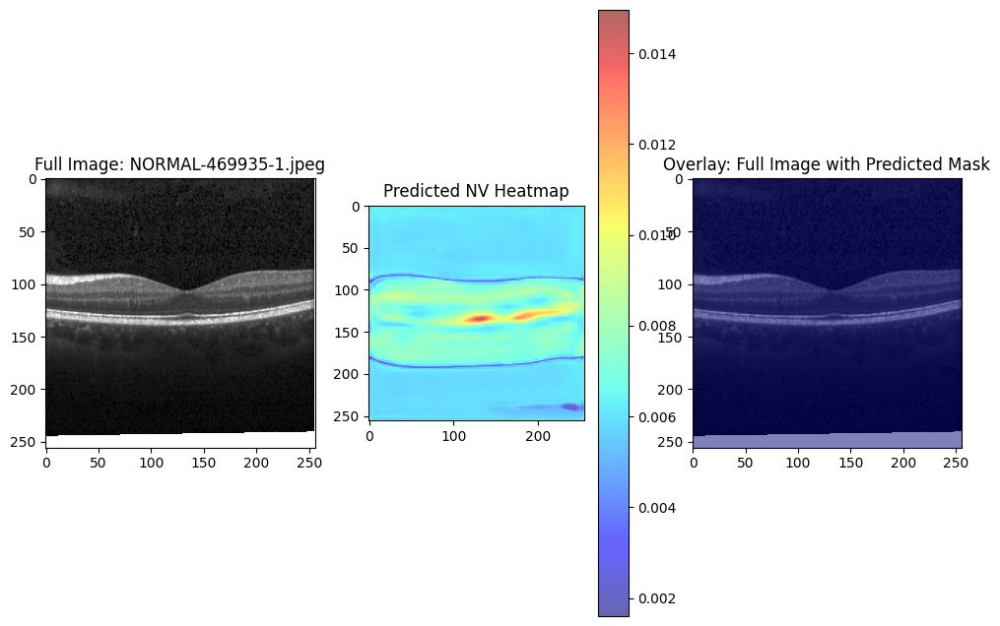

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


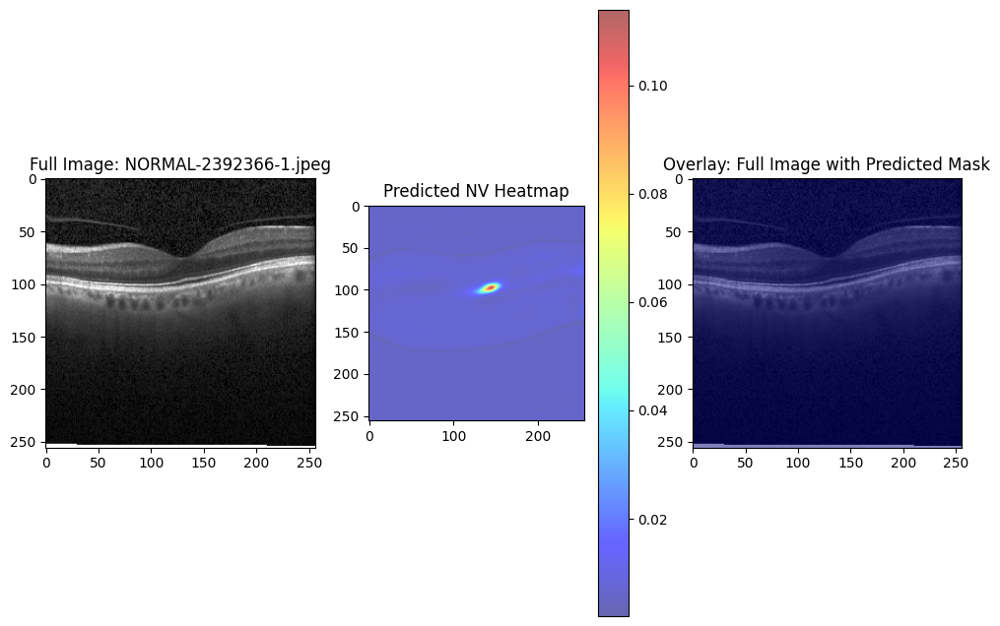

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


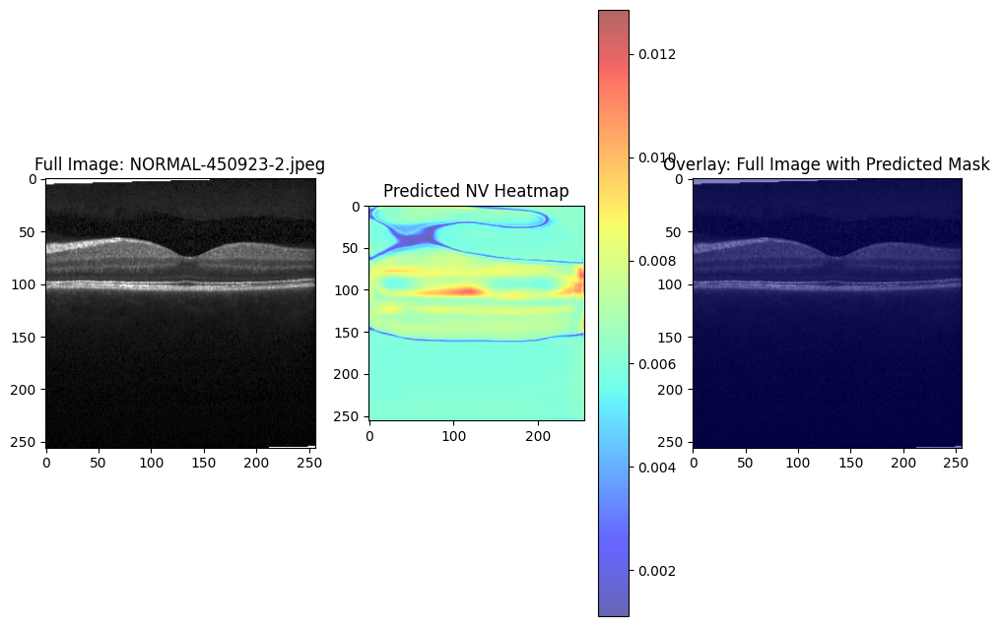

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


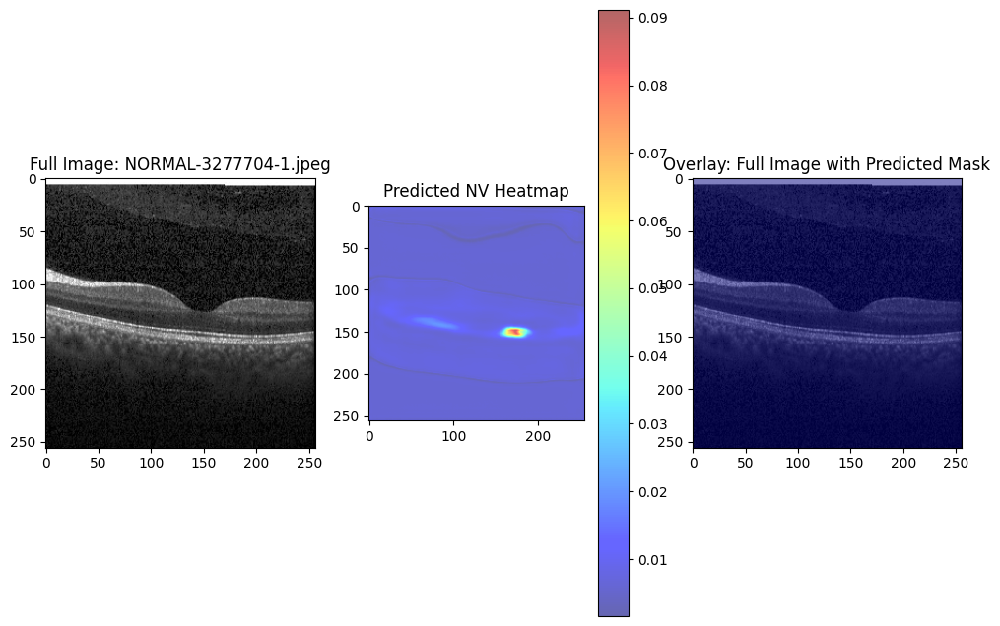

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


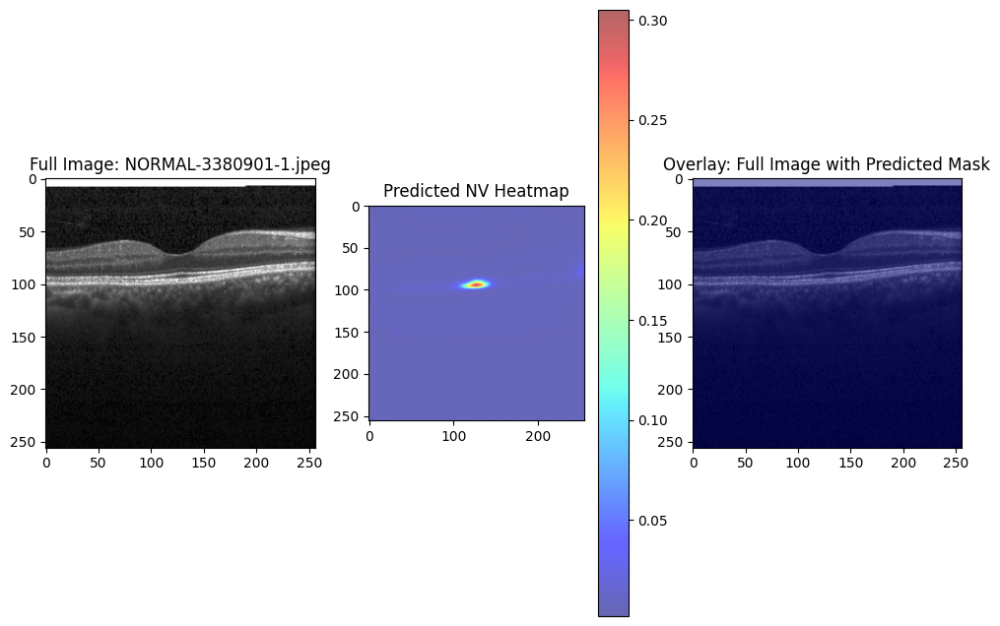

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


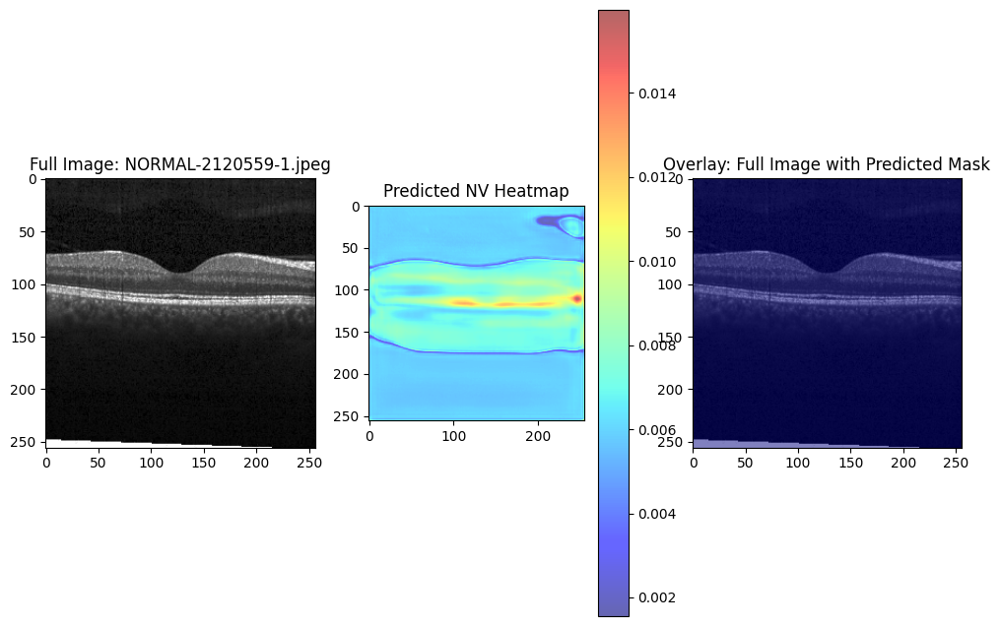

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


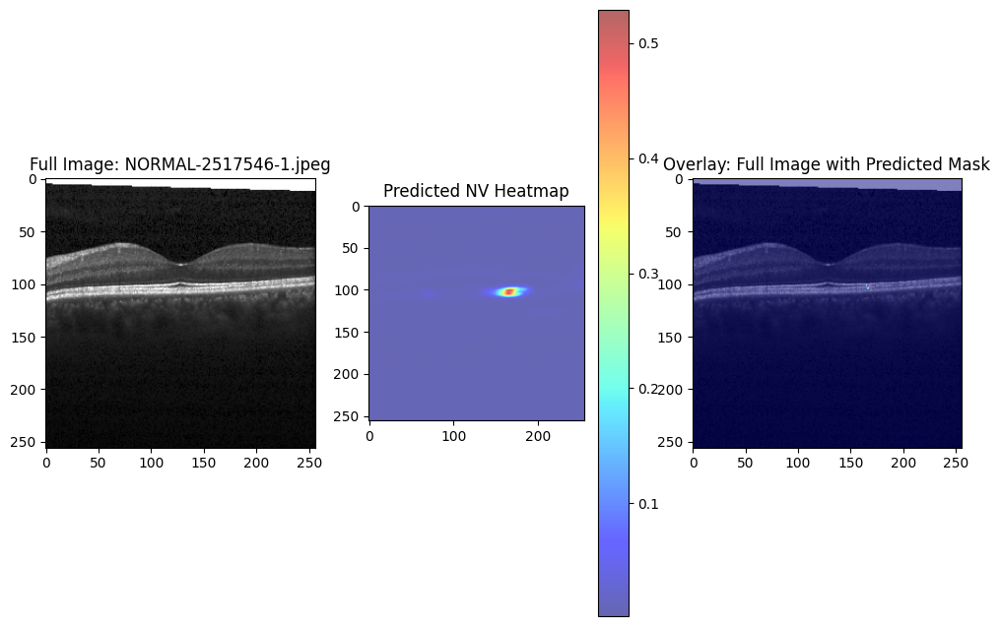

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


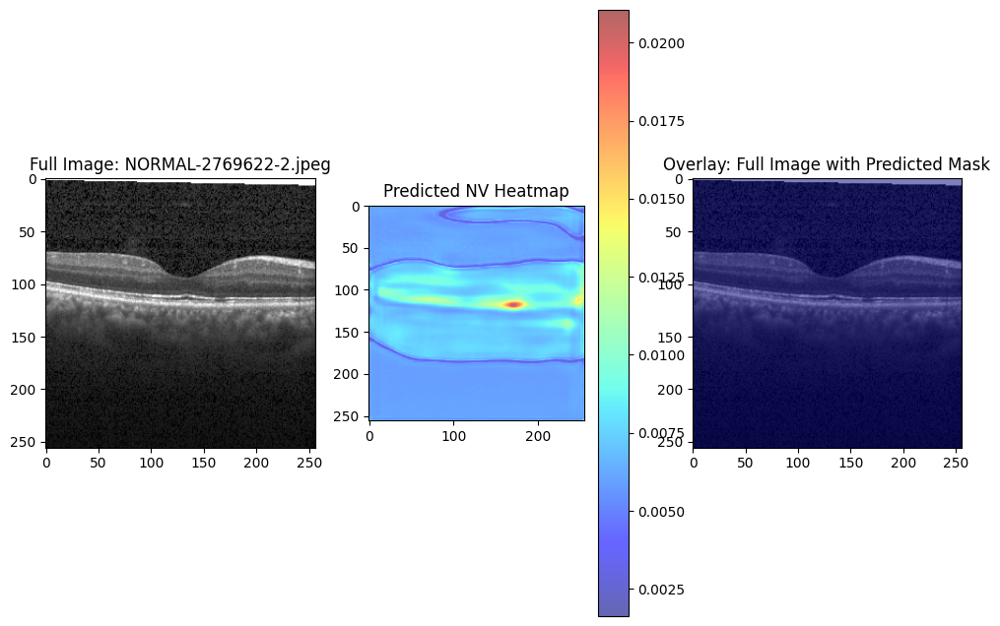

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


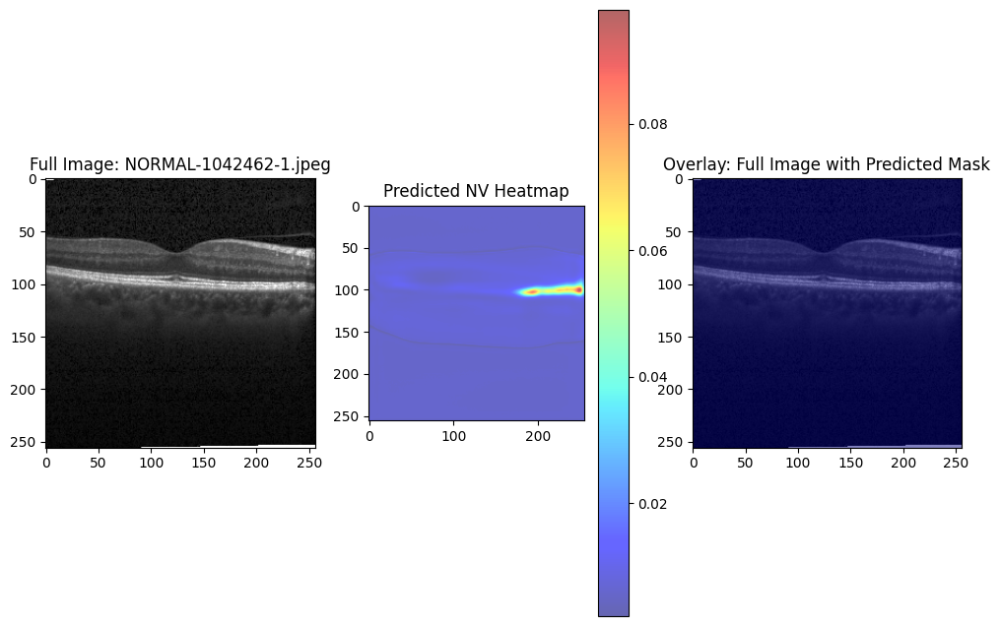

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from tensorflow.keras.models import load_model

# Load and preprocess the full image for prediction
def load_full_image(image_path, target_size=(256, 256)):
    full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
    full_image_array = img_to_array(full_image) / 255.0
    full_image_array = np.expand_dims(full_image_array, axis=0)
    return full_image_array


# loaded_model = load_model('/content/drive/MyDrive/Working/models/unet_model_62epoch_423.h5')
loaded_model = load_model('/content/drive/MyDrive/Working/models/unet_model_62epoch_100.h5')

# Directory path containing the images to test

test_dir = '/content/drive/MyDrive/Working/val/NORMAL'

counter =0
# Loop through all images in the directory
for image_filename in os.listdir(test_dir):
    if image_filename.endswith('.jpeg') or image_filename.endswith('.jpg') or image_filename.endswith('.png'):
        full_image_path = os.path.join(test_dir, image_filename)

        # Load and preprocess the image
        full_image = load_full_image(full_image_path)

        # Predict the mask for the full image
        predicted_mask = model.predict(full_image)[0, :, :, 0]  # Get the predicted mask

        # Incase of testing saved model
        # predicted_mask = loaded_model.predict(full_image)[0, :, :, 0]  # Extract the 2D mask


        threshold = 0.5
        predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

        if (counter == 10):
          break
        else:
          counter += 1

        plt.figure(figsize=(12, 8))

        # Display the original full image
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(full_image), cmap='gray')
        plt.title(f'Full Image: {image_filename}')

        # Display the predicted NV mask heatmap
        plt.subplot(1, 3, 2)
        plt.imshow(predicted_mask, cmap='jet', alpha=0.6)
        plt.title('Predicted NV Heatmap')
        plt.colorbar()

        # Overlay predicted mask on the full image
        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(full_image), cmap='gray')  # Original image
        plt.imshow(predicted_mask_binary, cmap='jet', alpha=0.5)  # Predicted mask overlay
        plt.title('Overlay: Full Image with Predicted Mask')

        # Show the plots
        plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


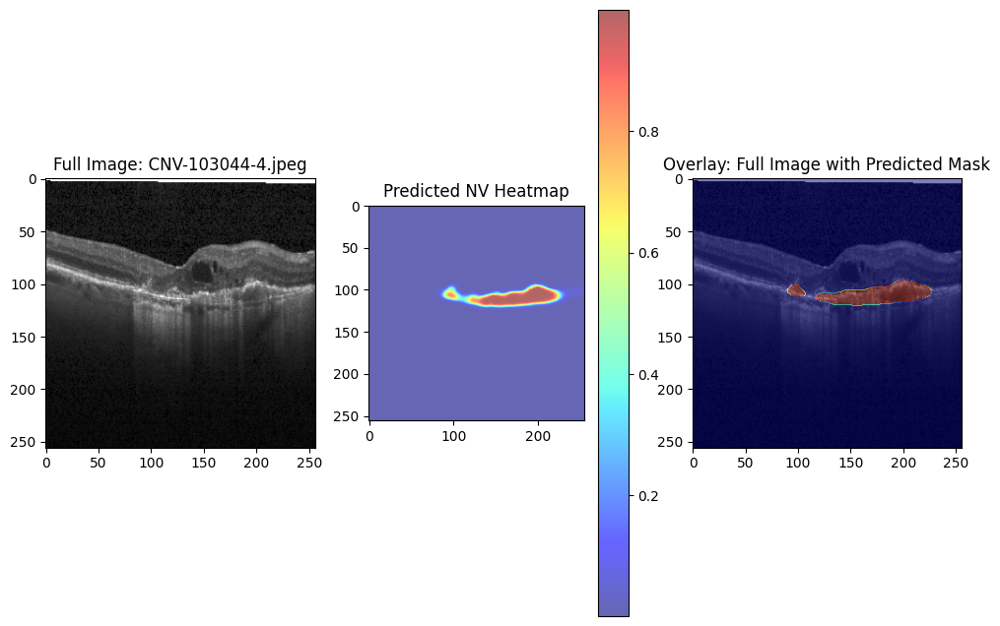

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


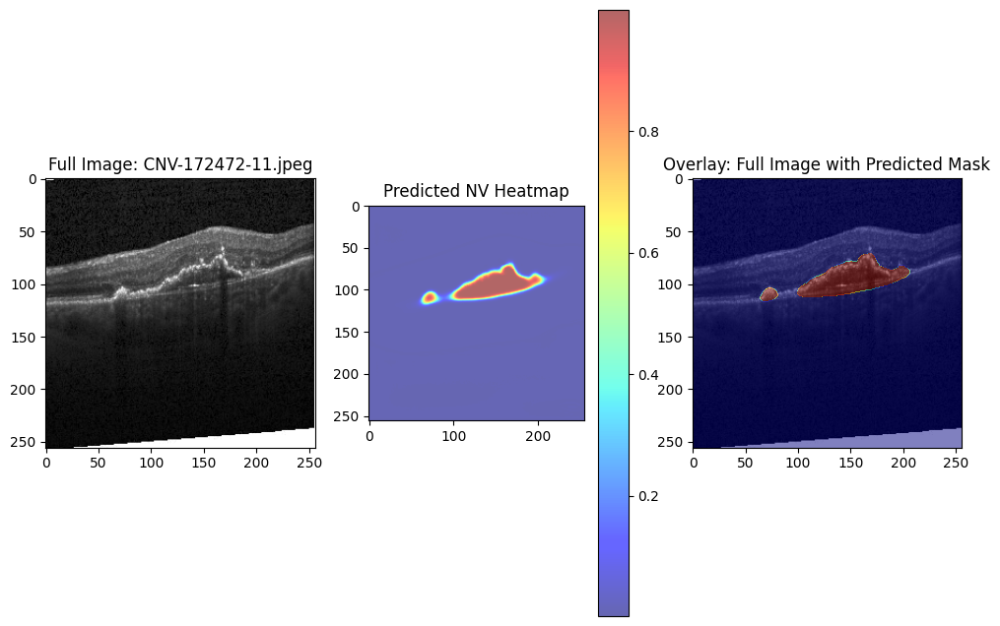

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


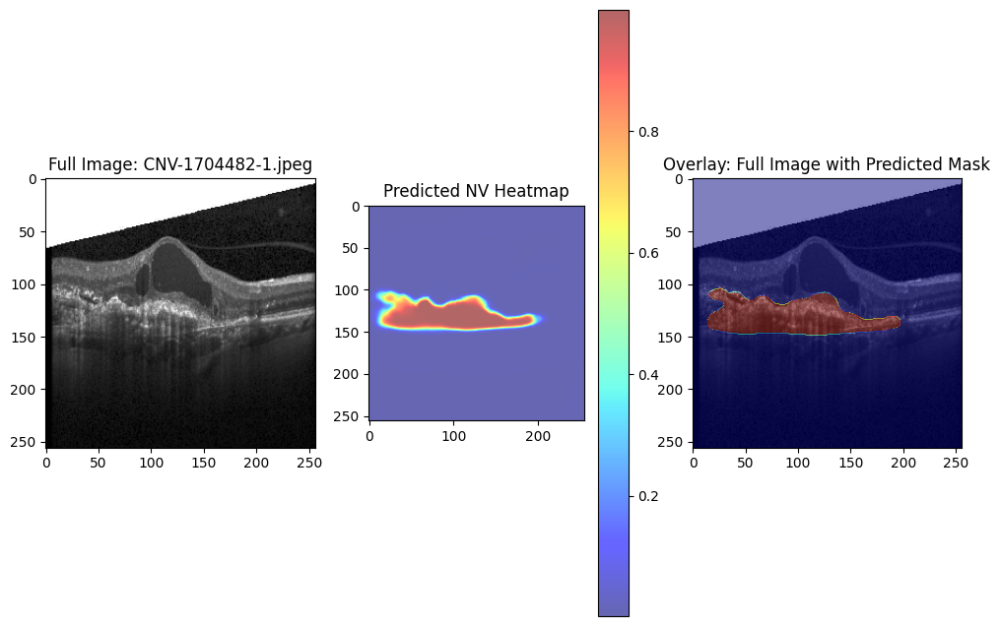

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


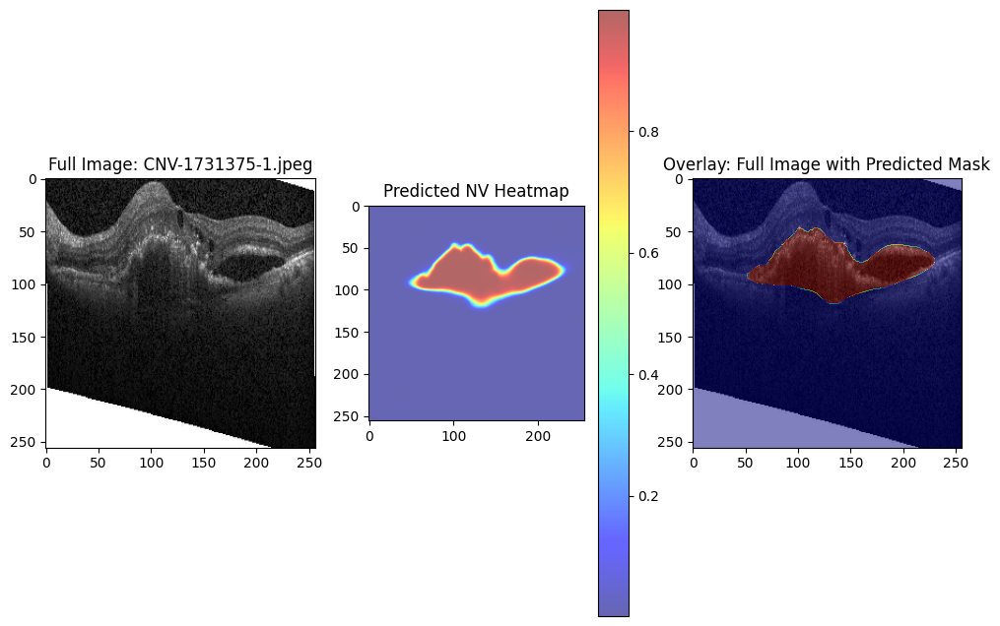

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


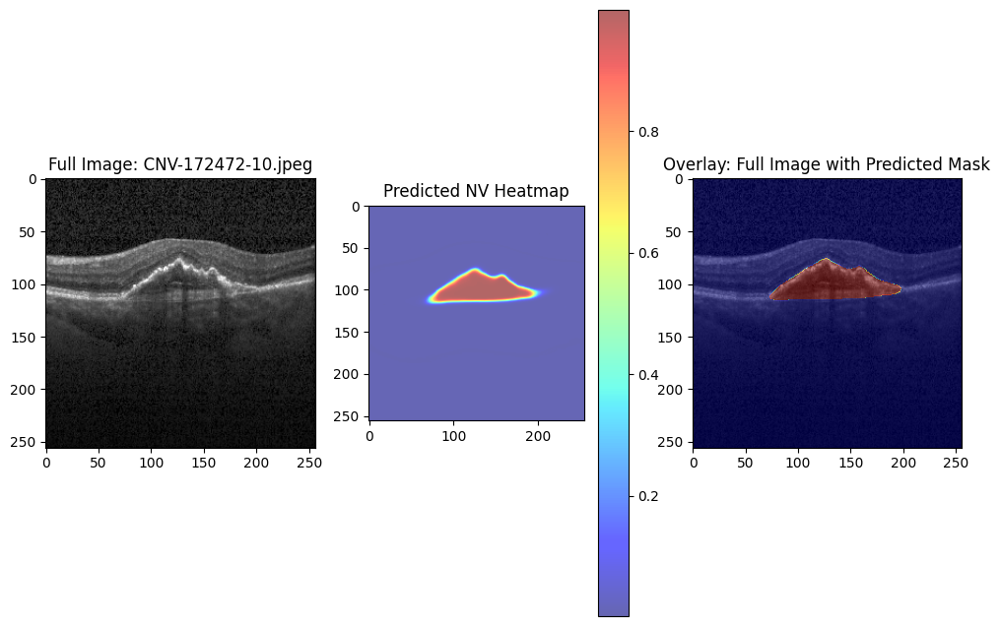

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


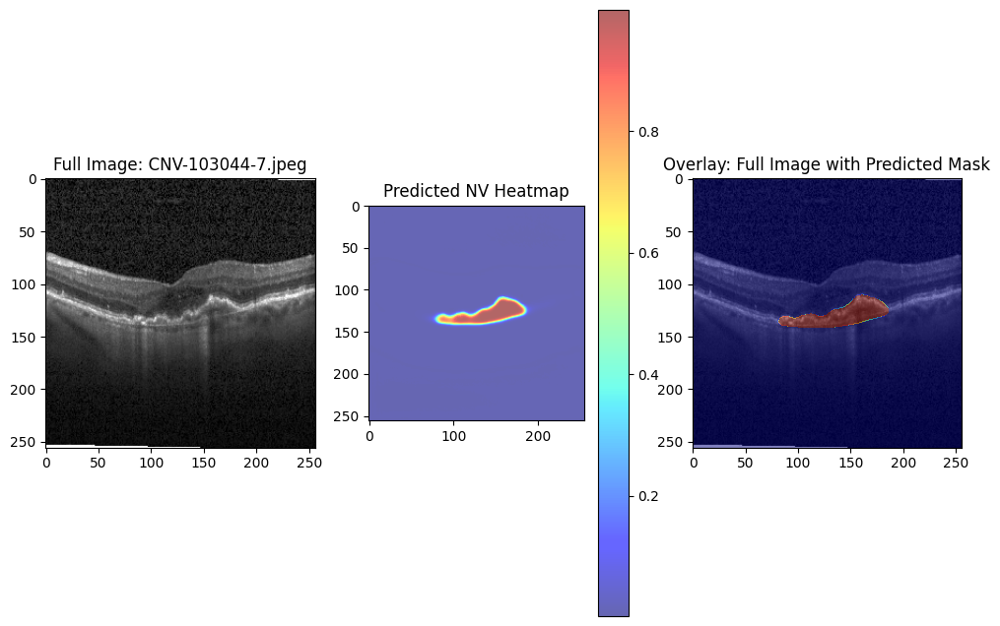

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


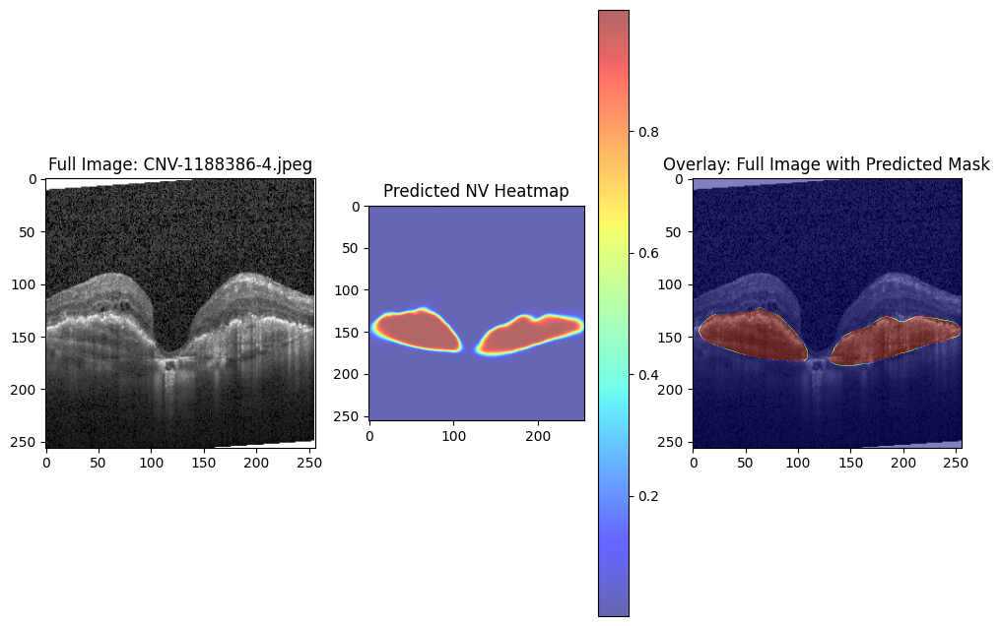

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


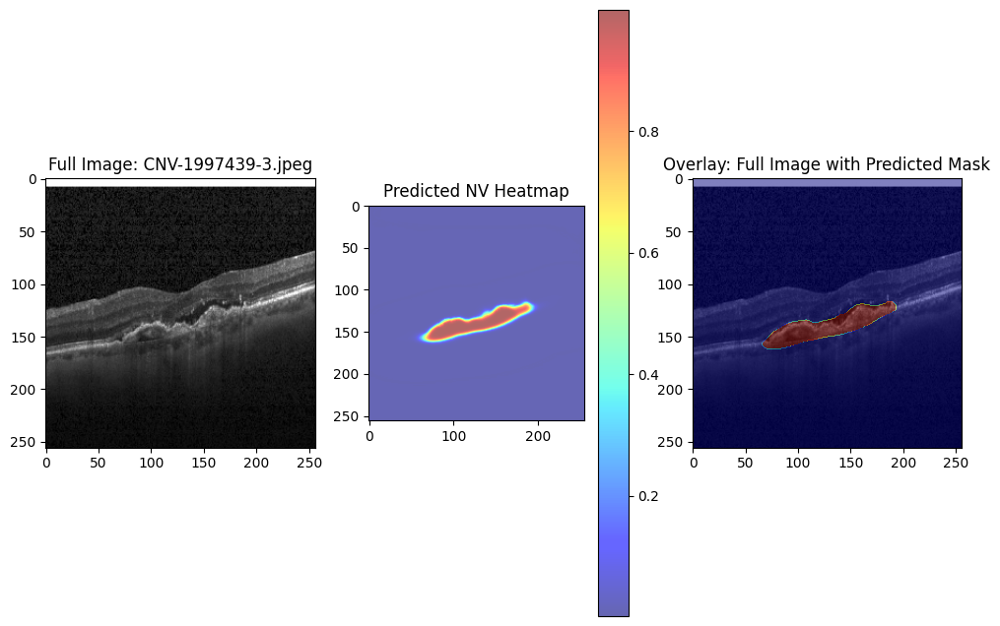

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


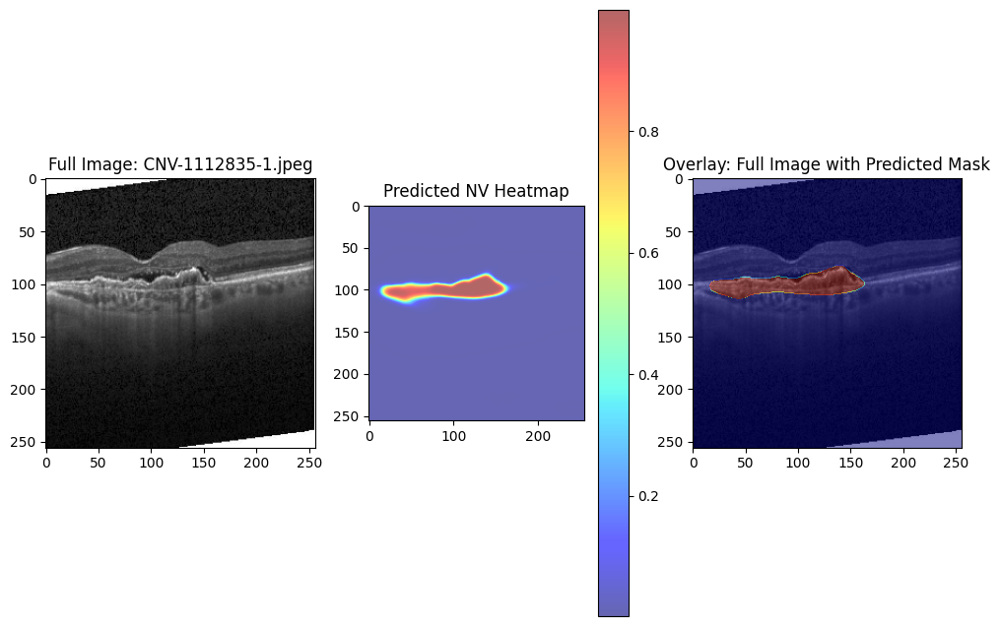

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


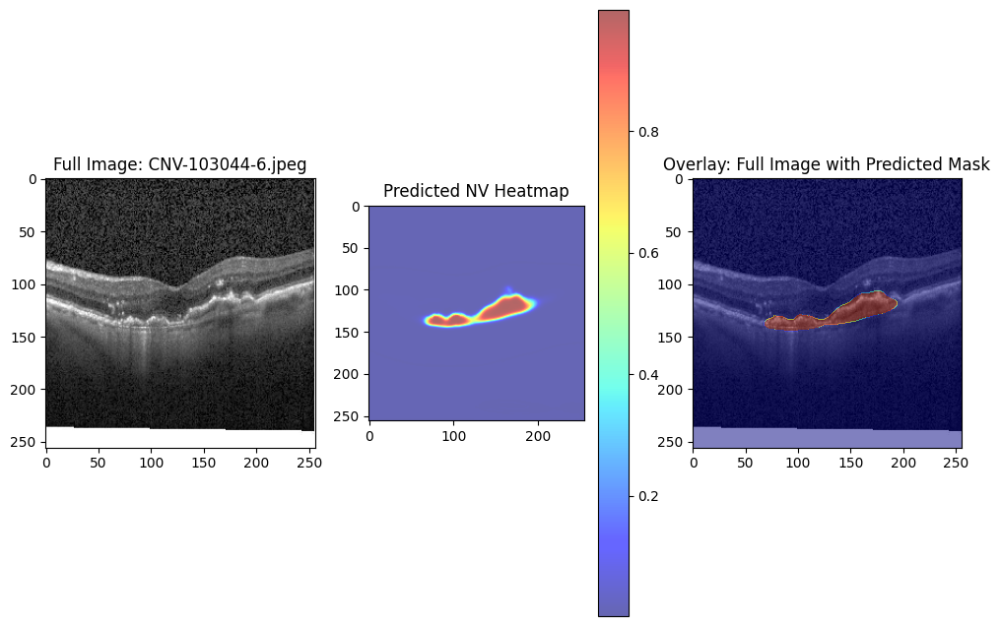

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


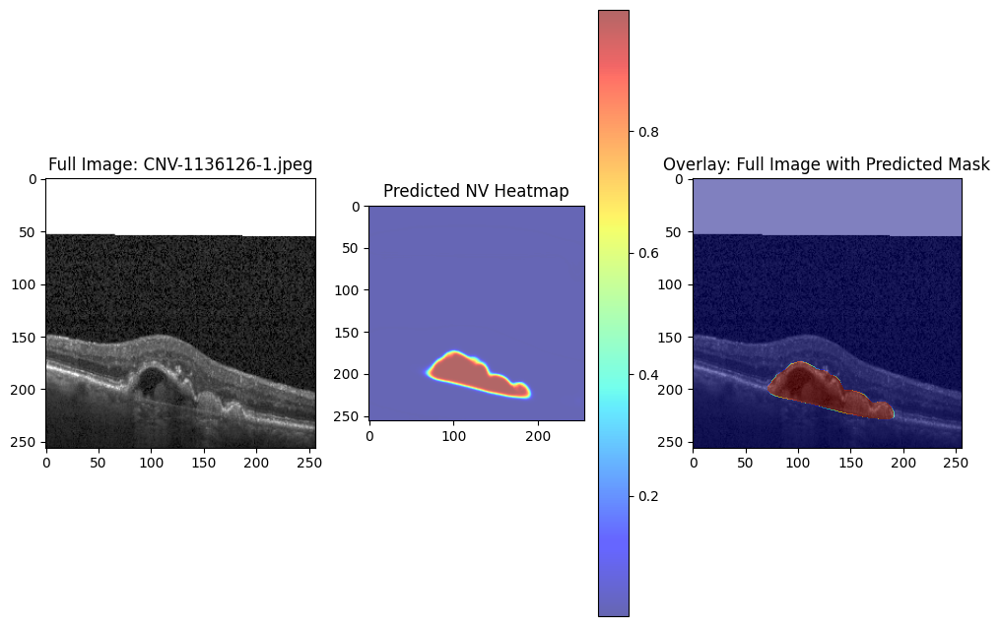

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


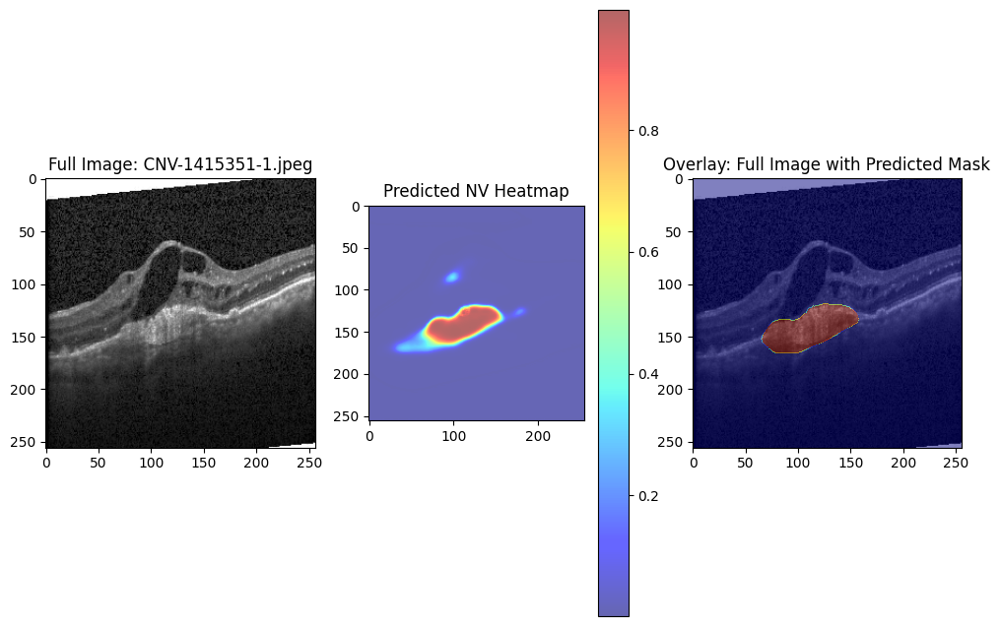

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


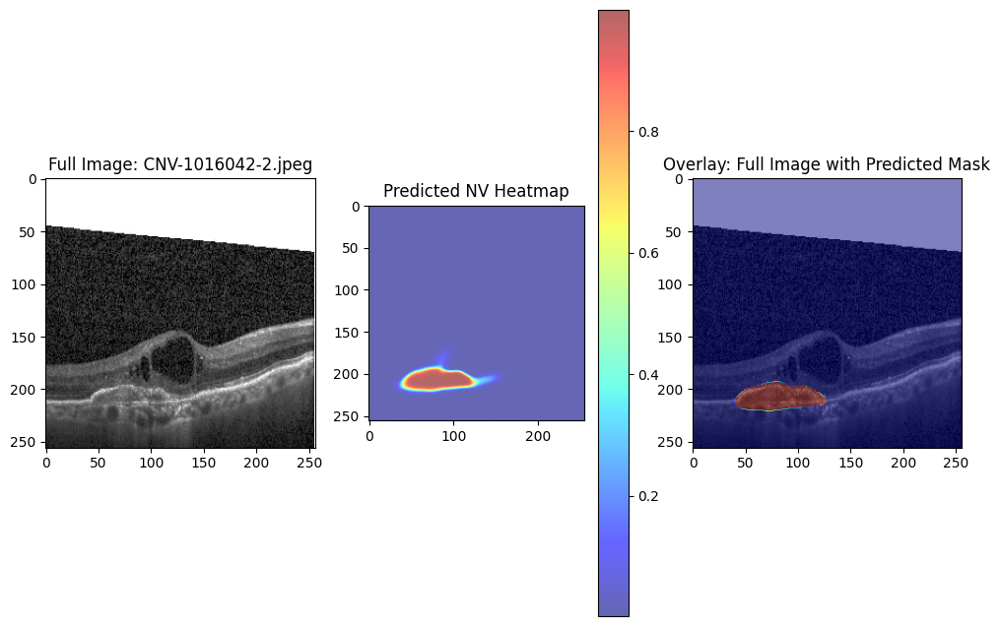

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


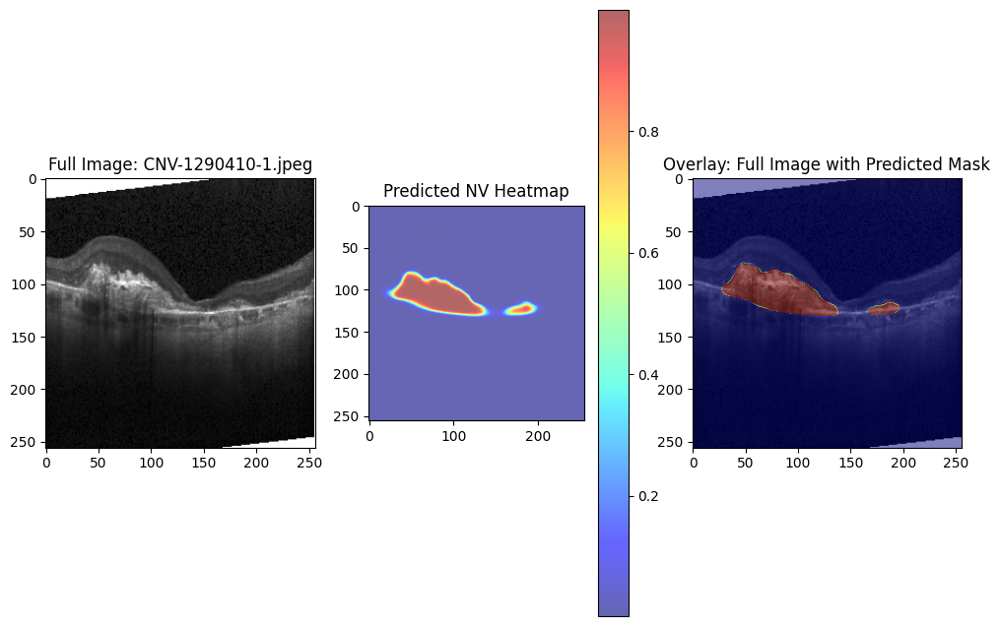

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


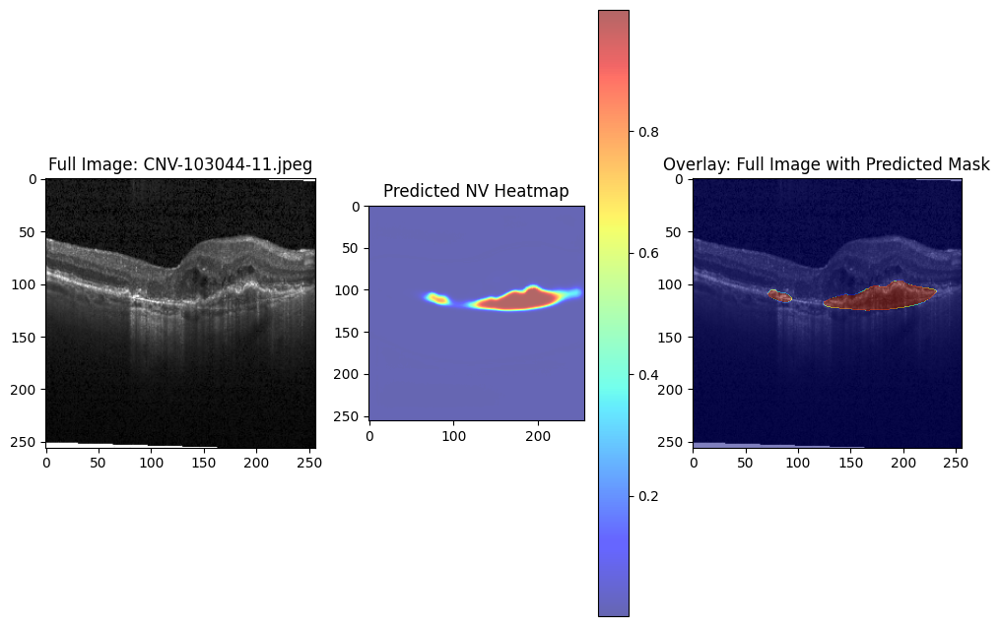

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


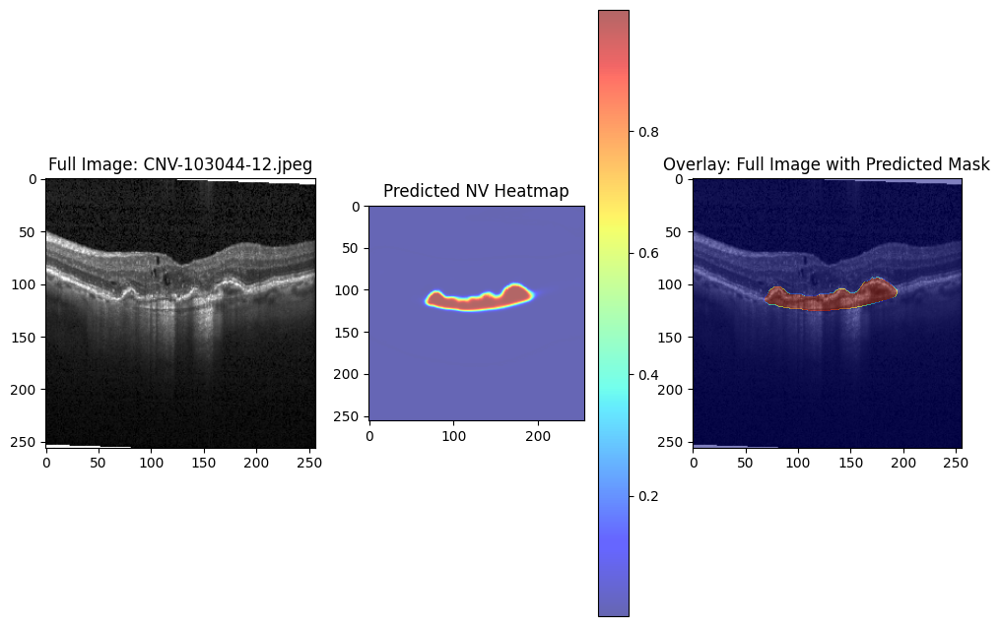

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


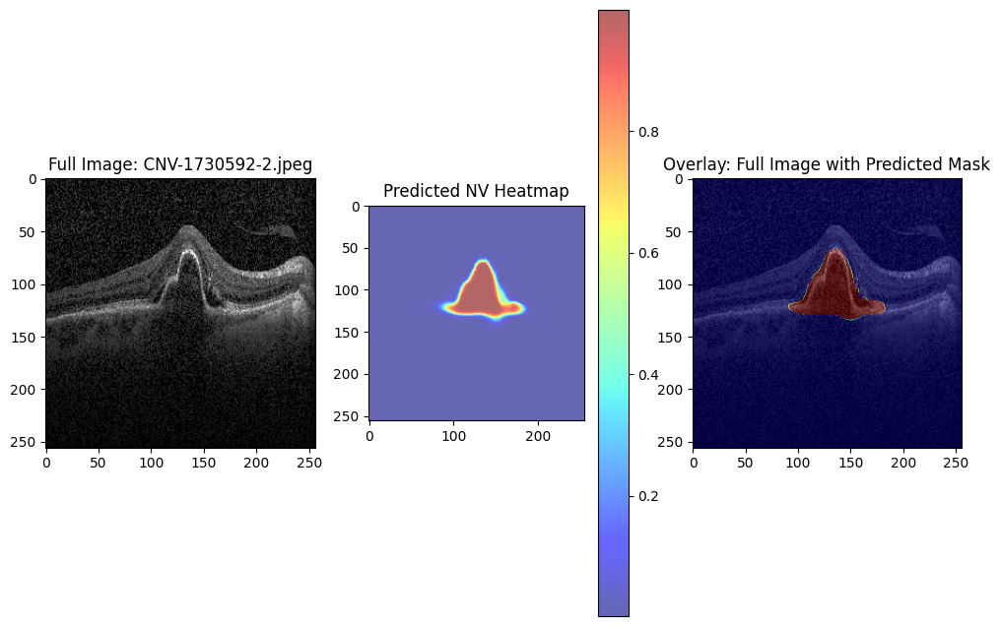

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


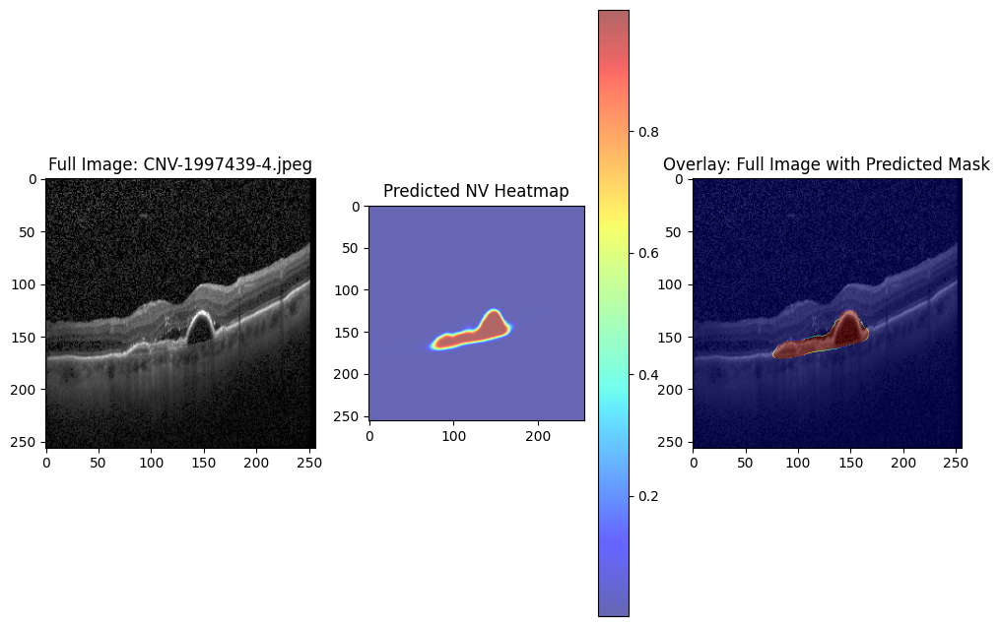

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


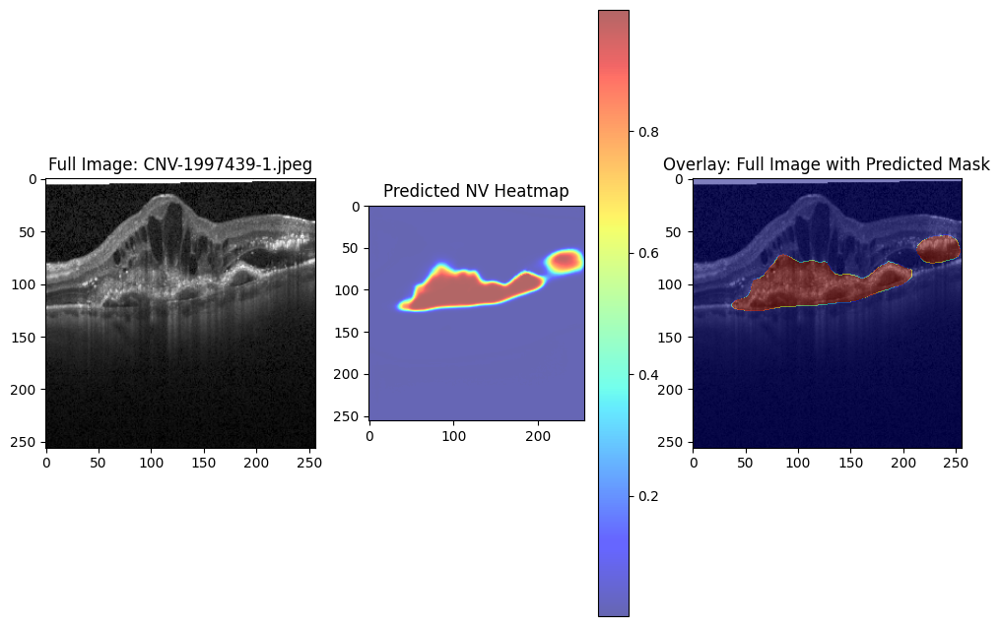

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


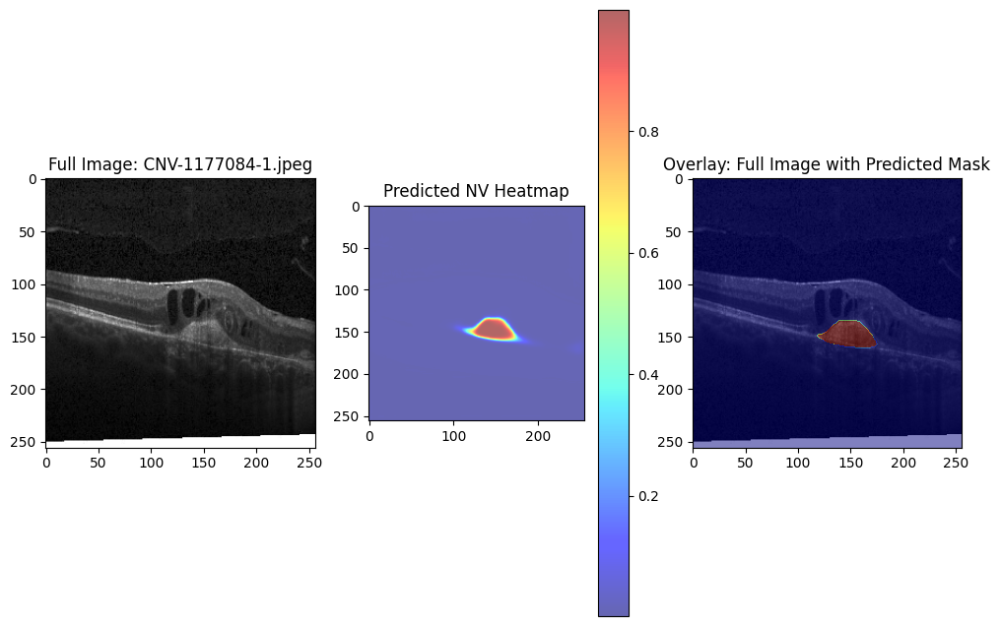

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


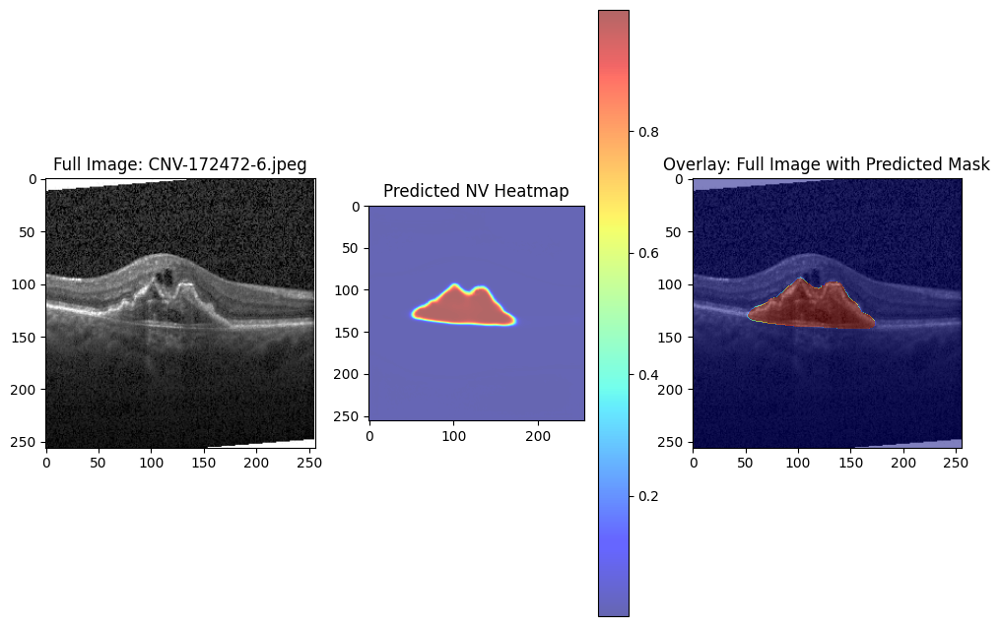

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


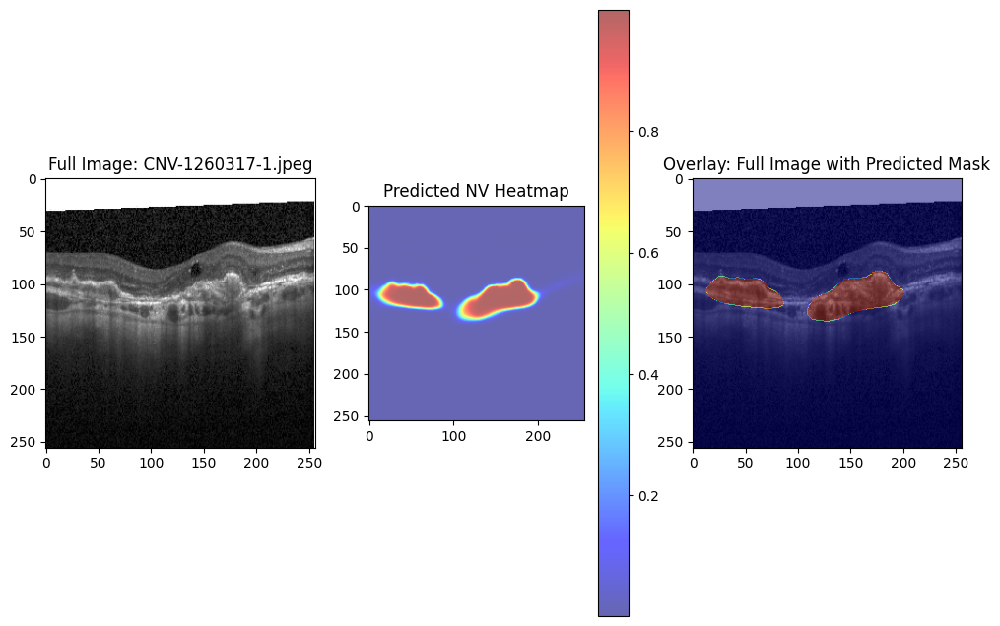

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


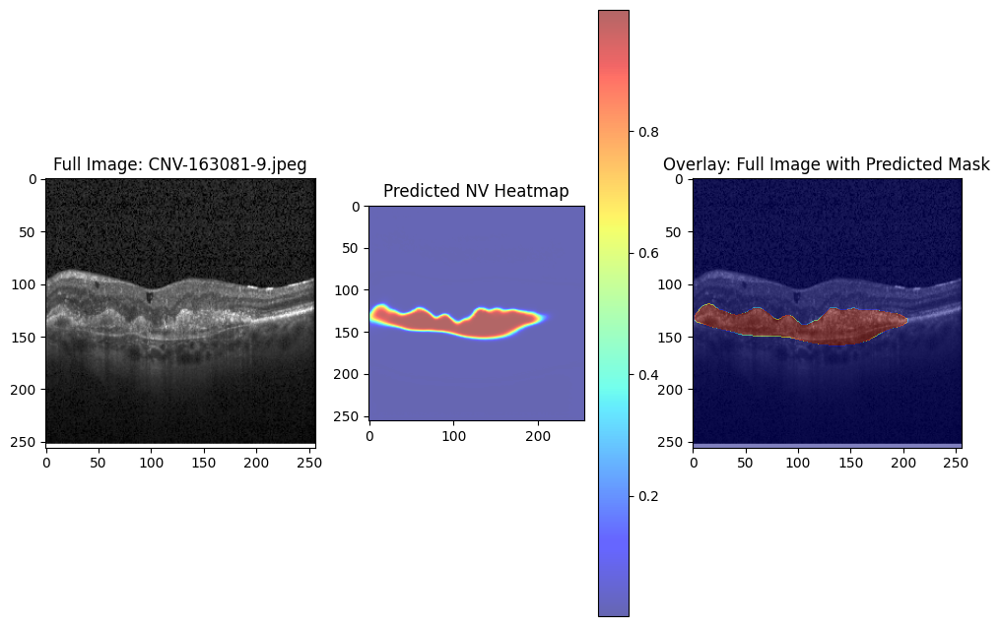

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


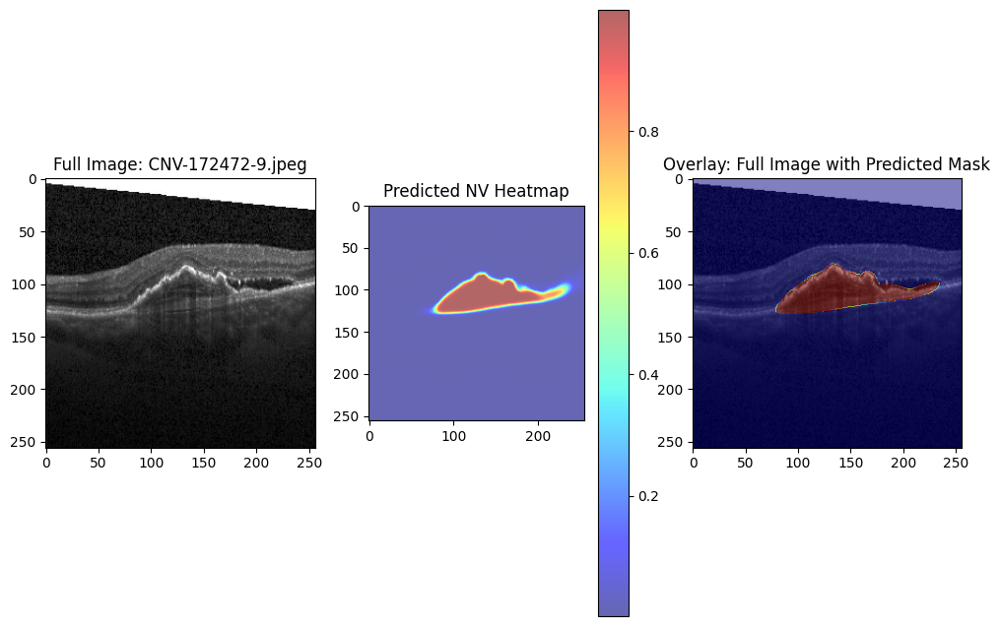

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


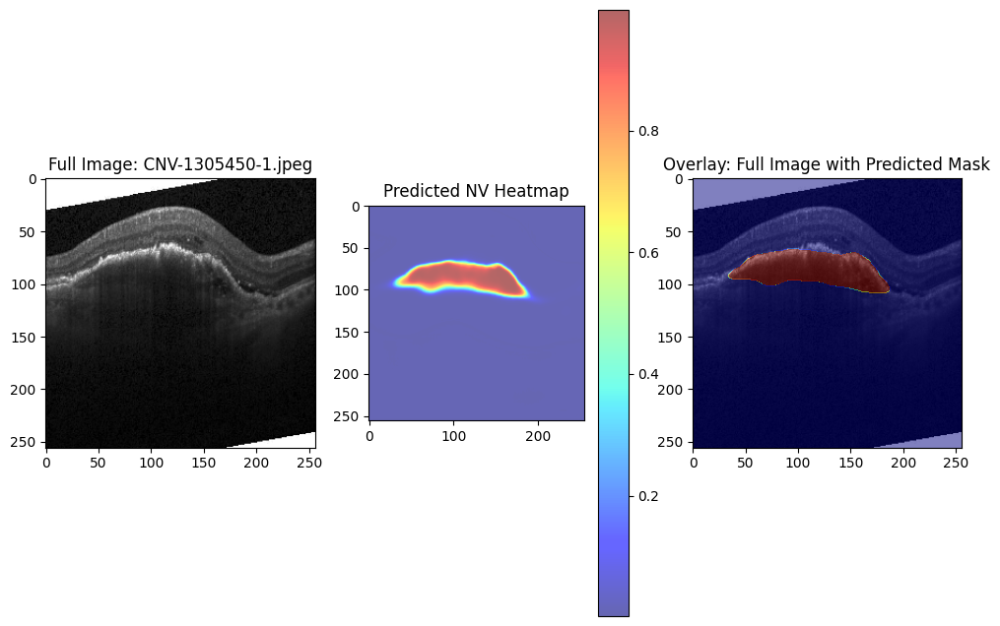

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


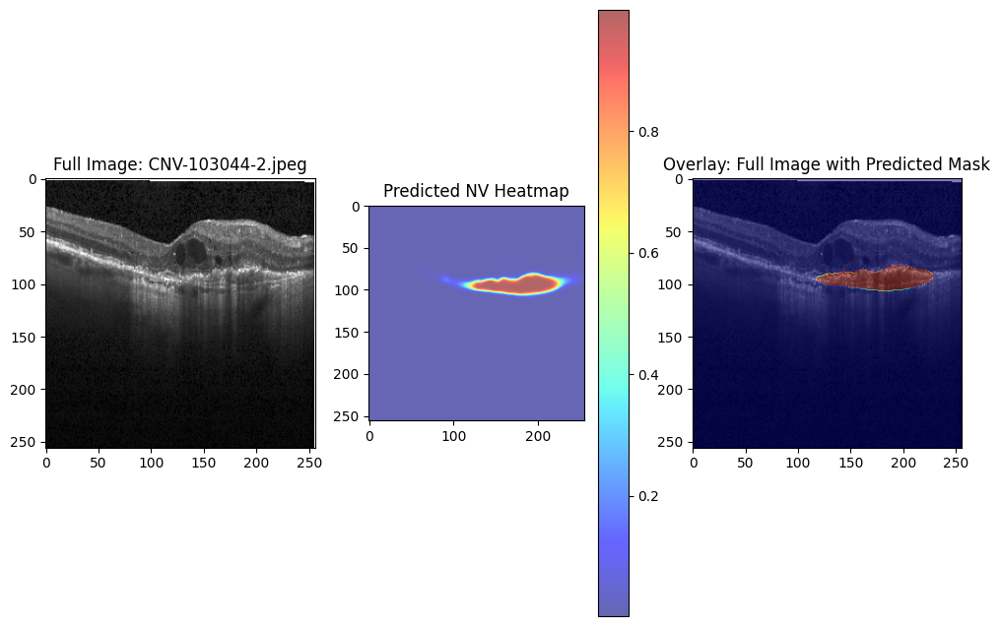

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


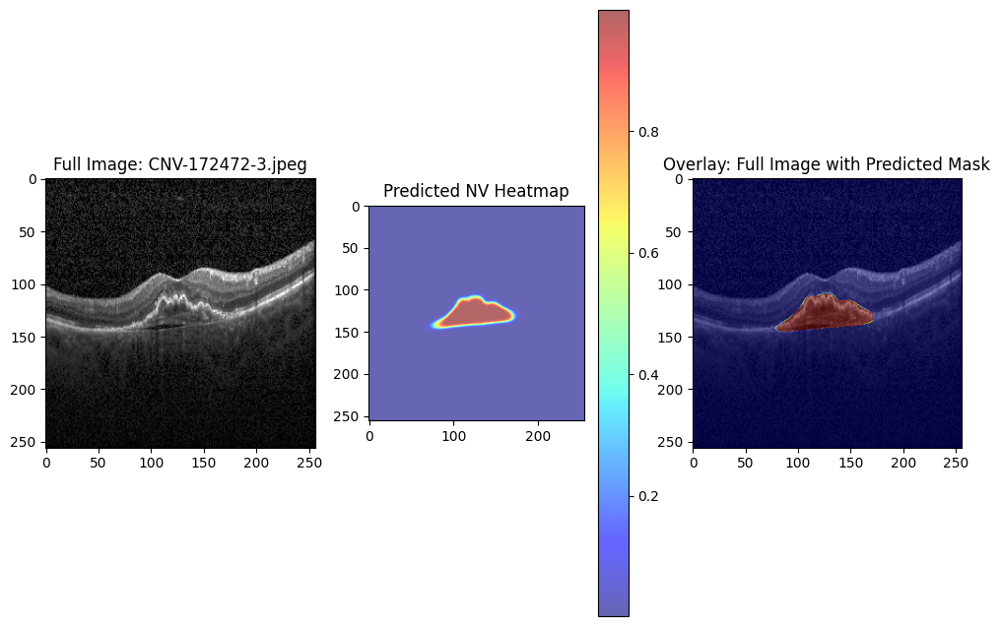

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


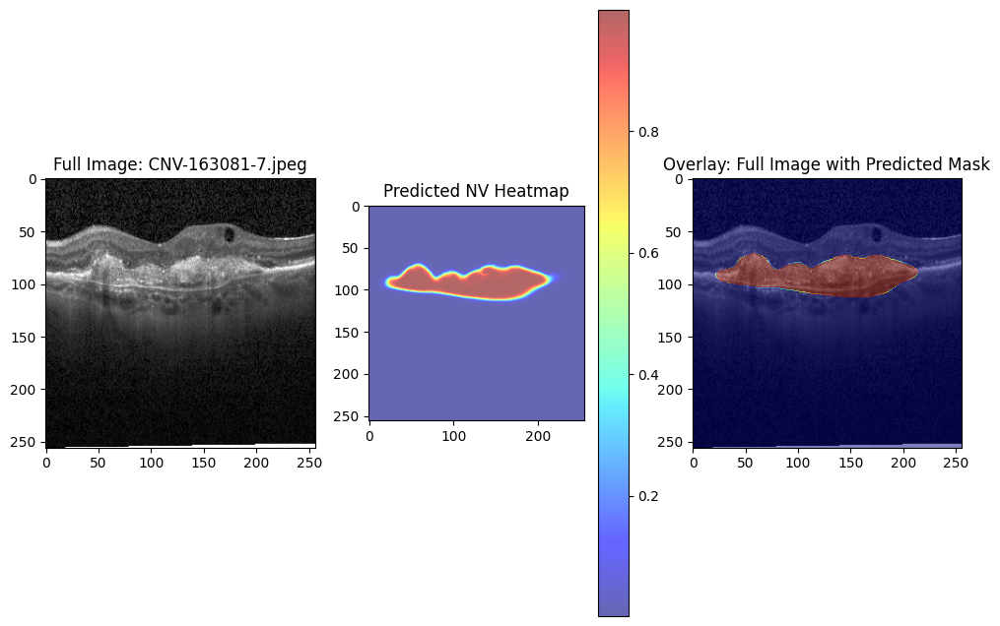

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


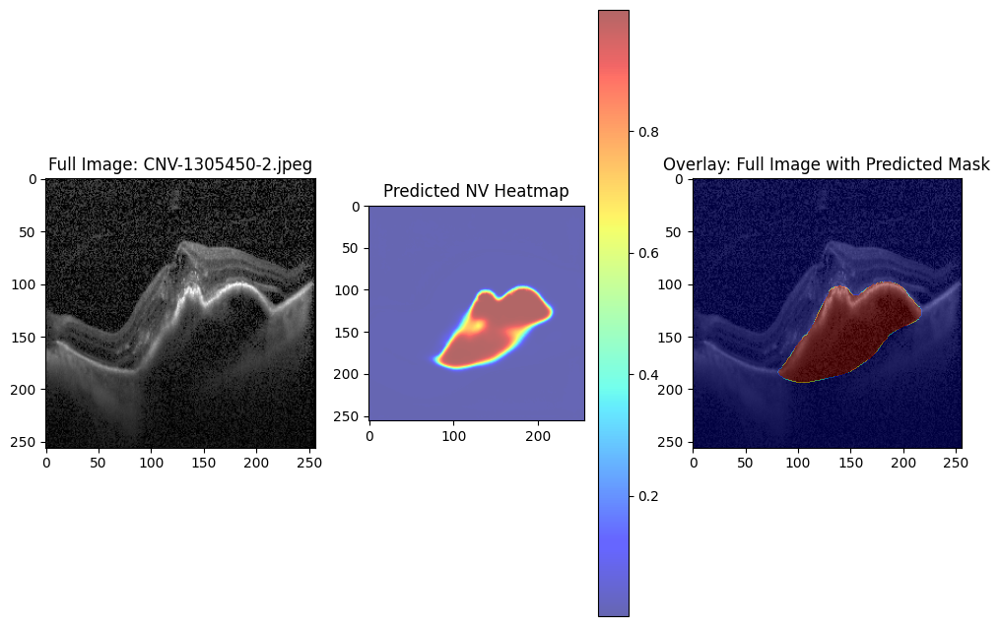

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


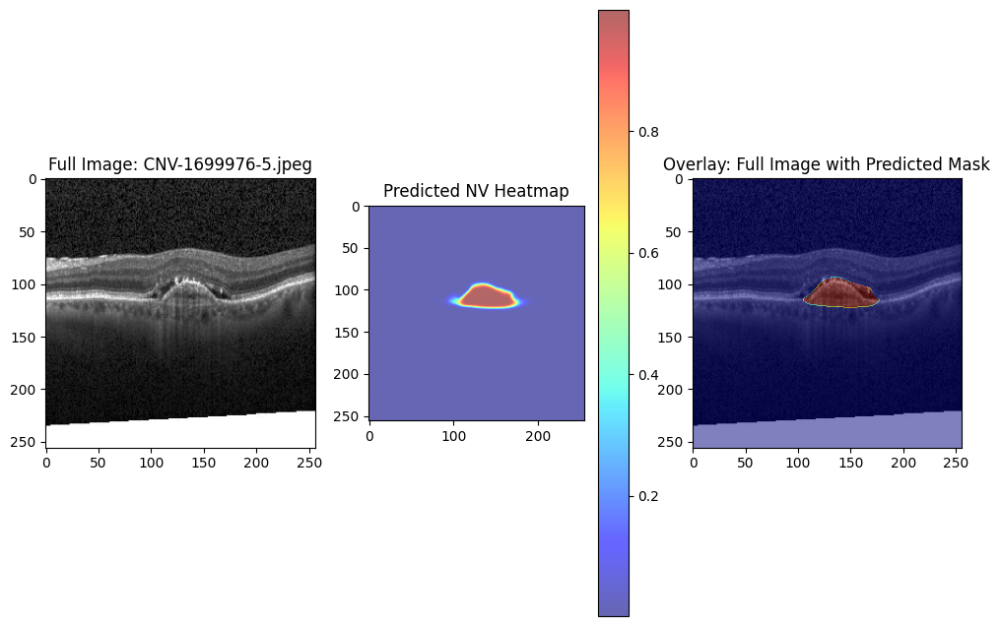

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


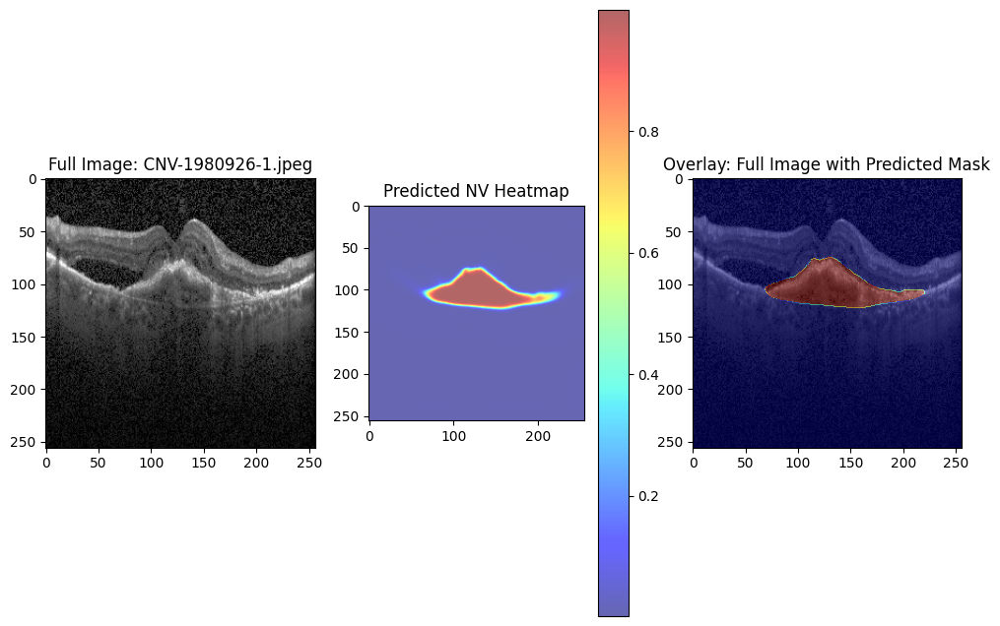

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


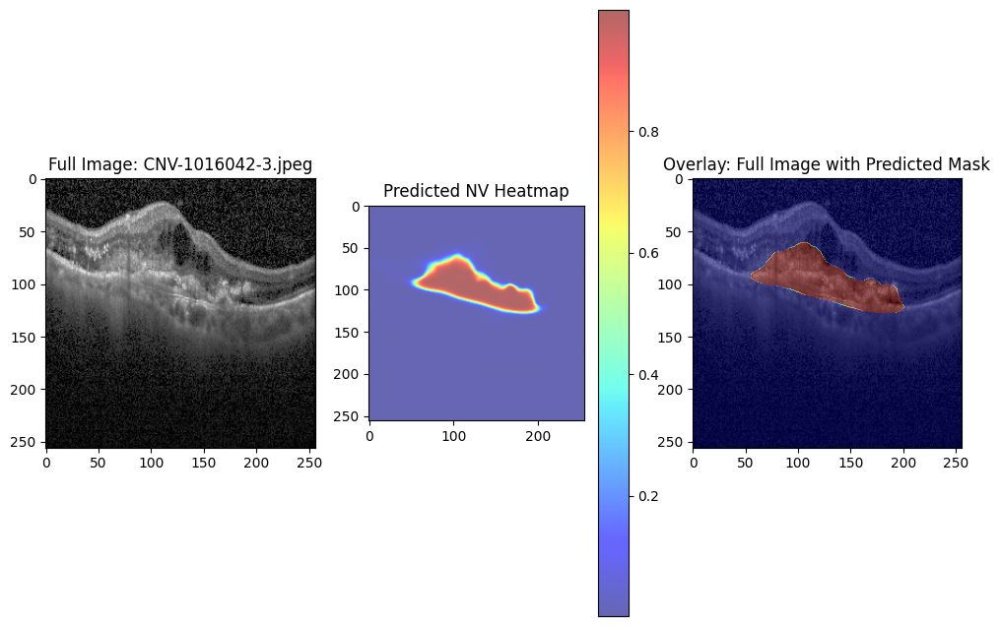

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


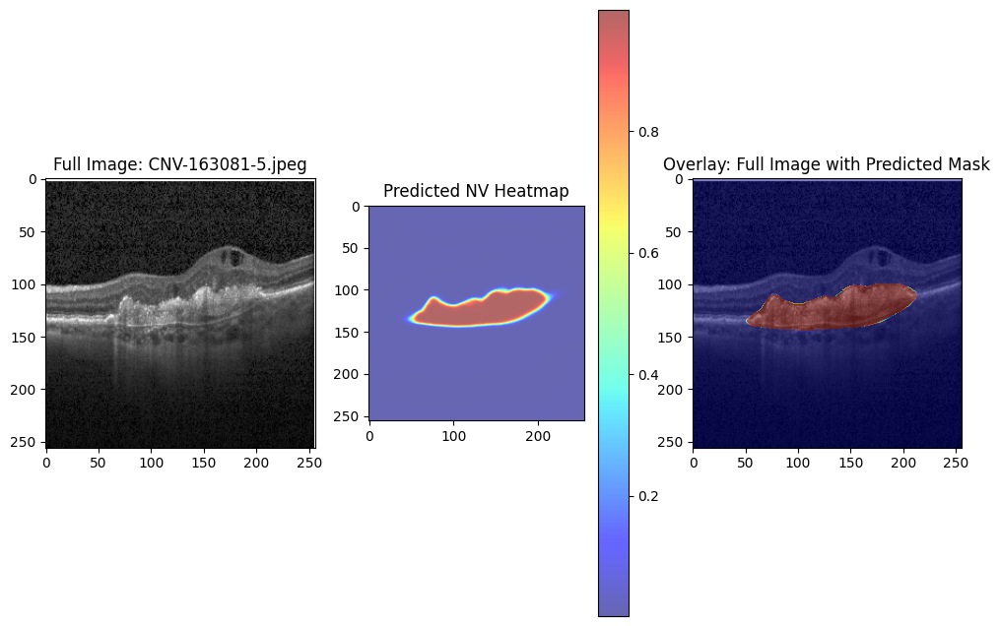

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


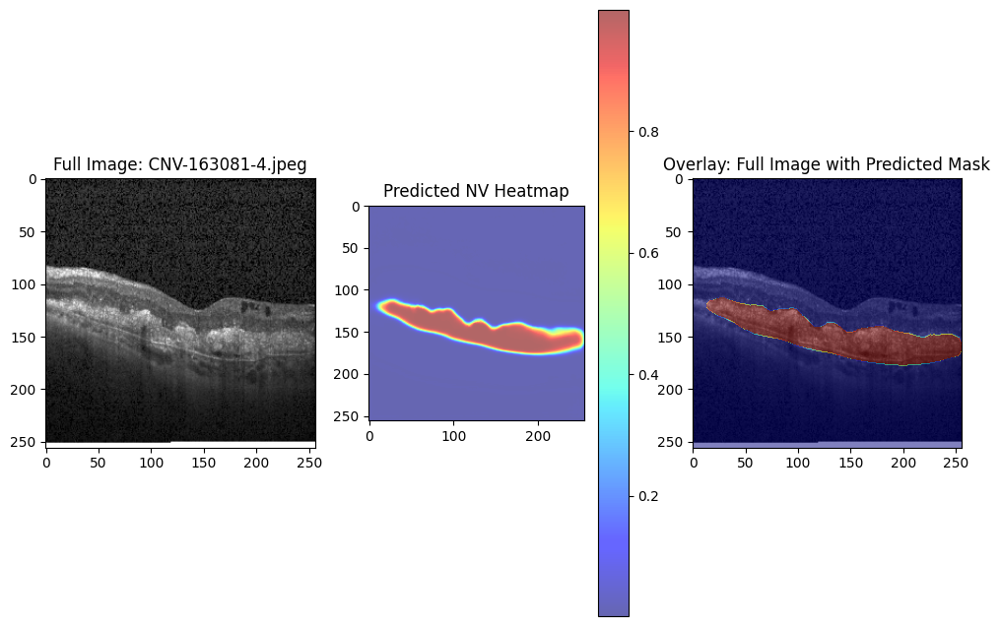

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


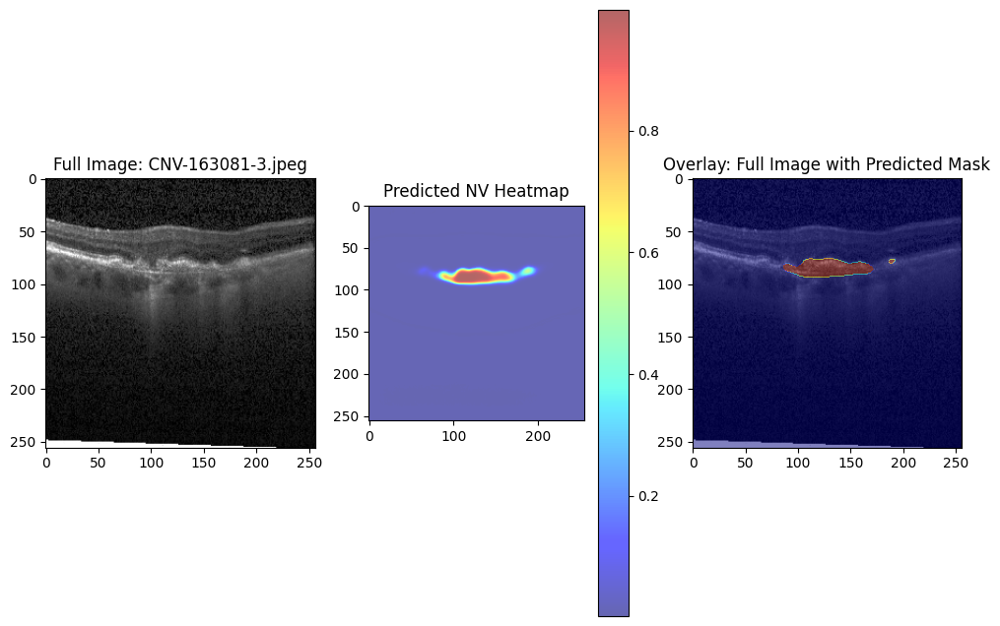

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


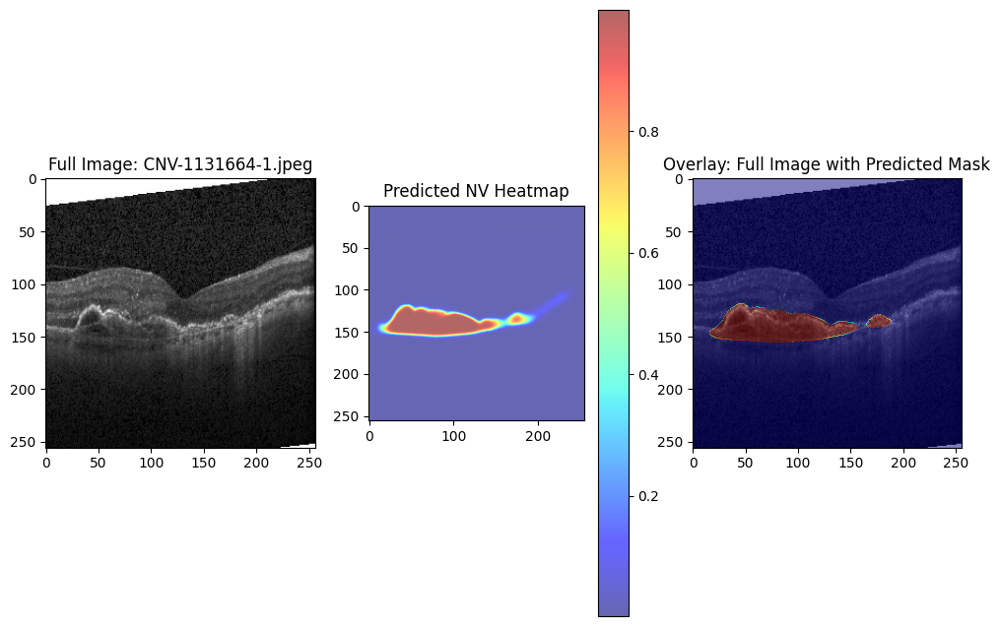

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


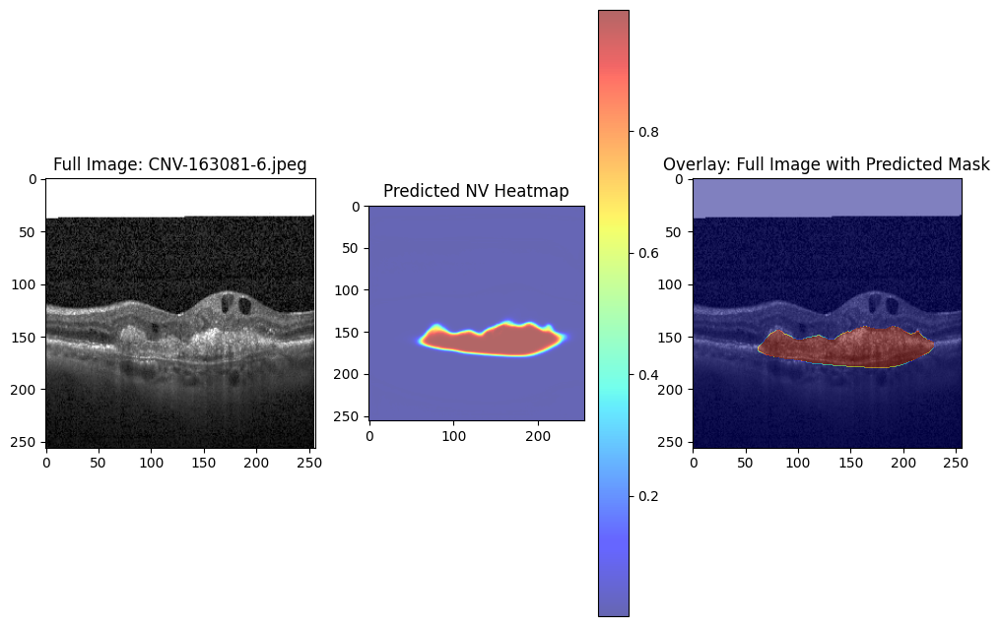

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


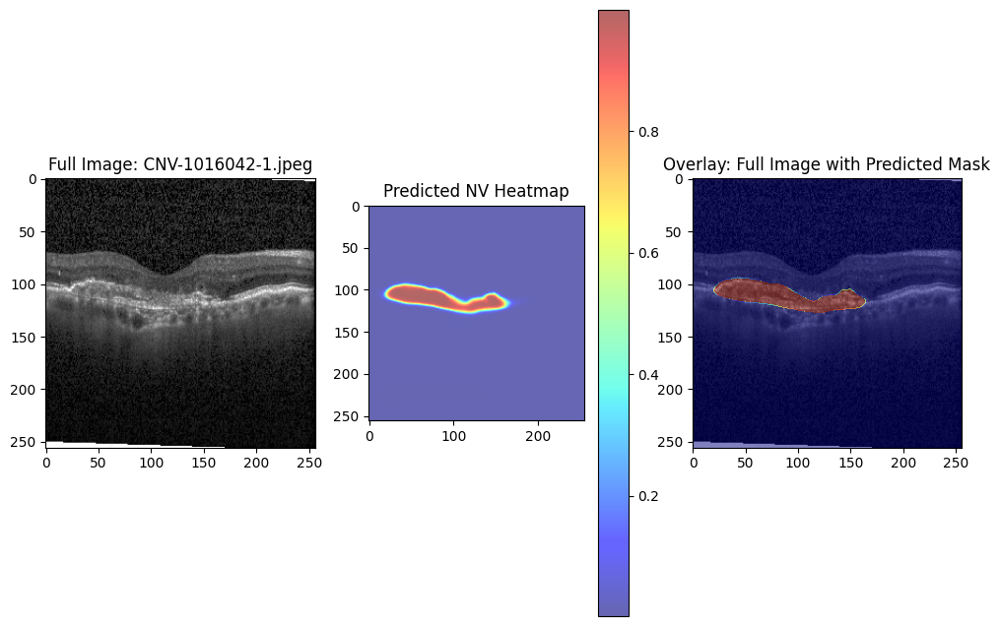

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


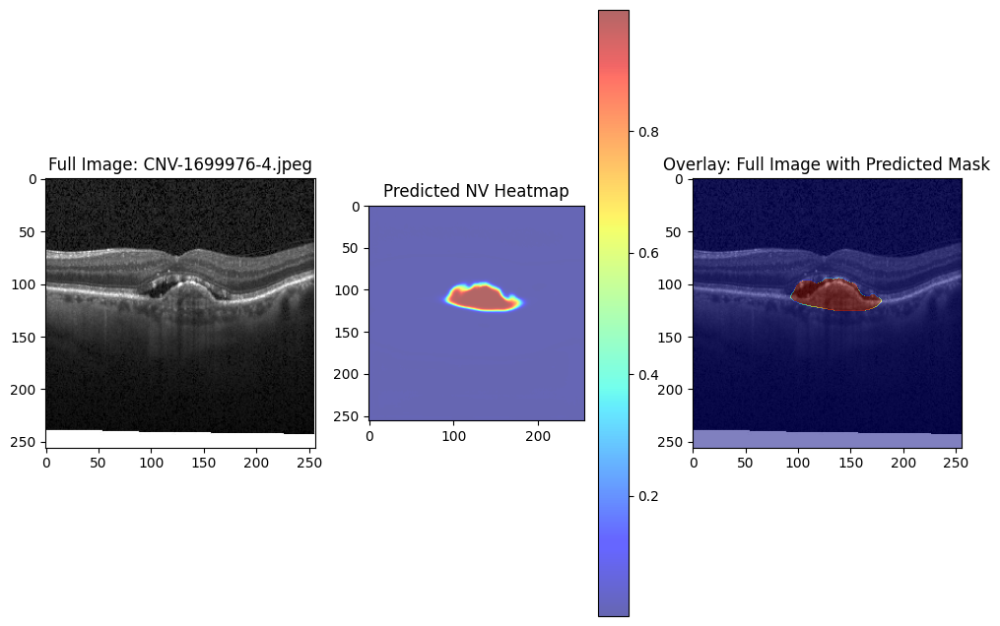

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


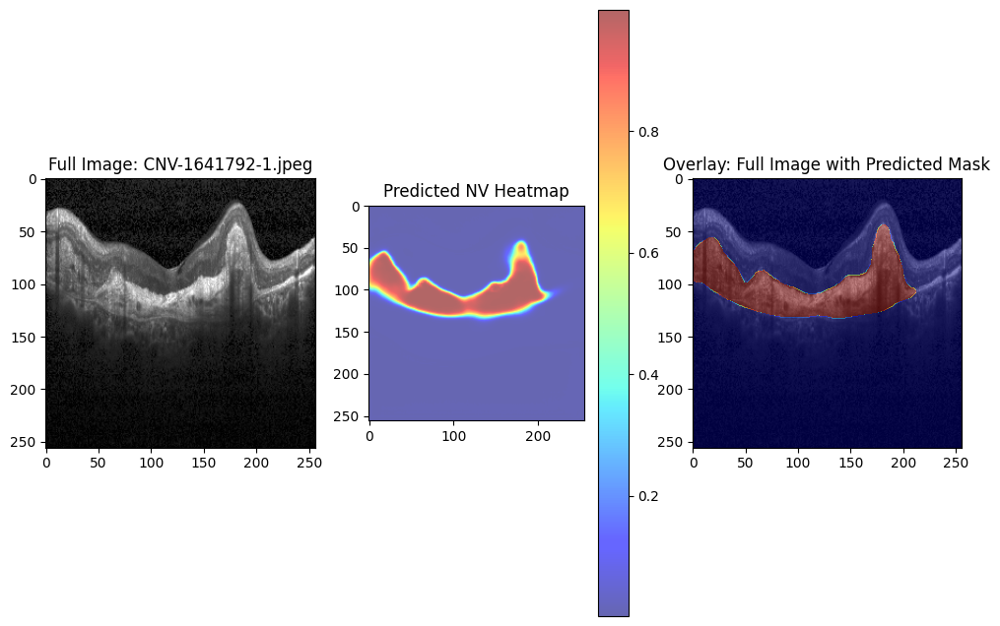

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


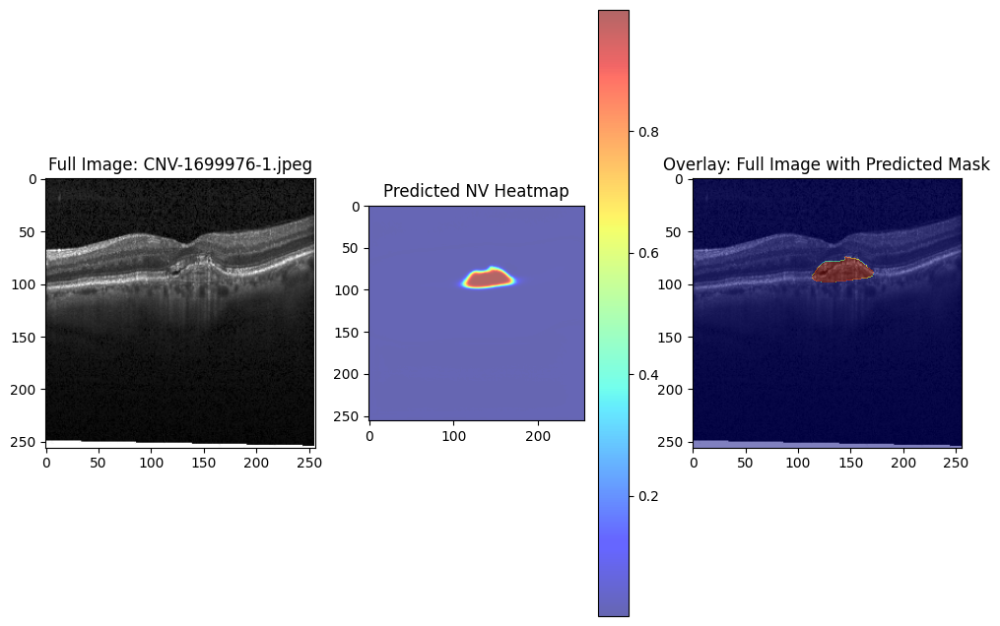

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


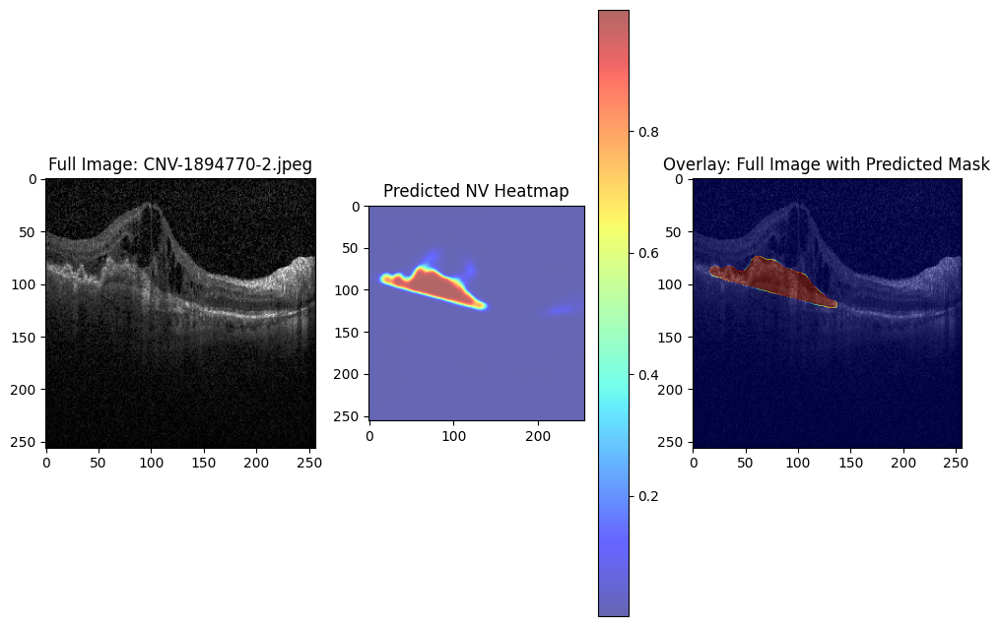

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


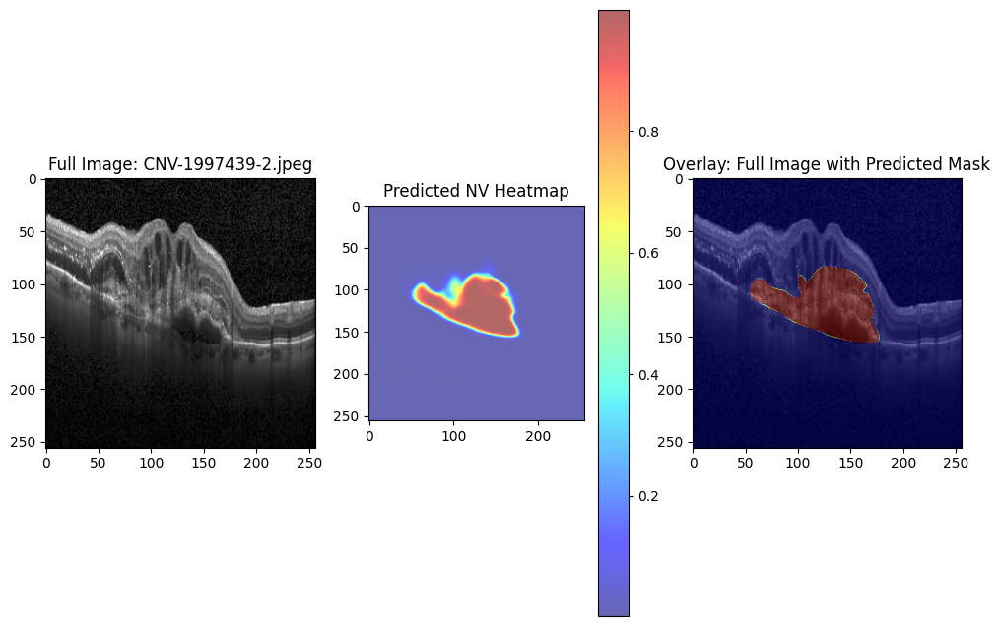

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


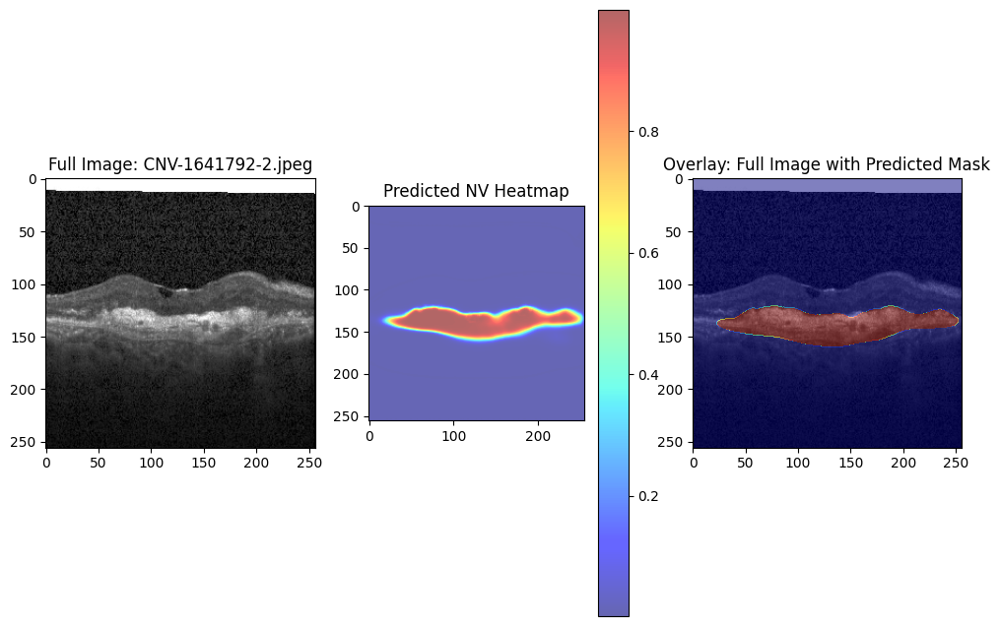

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


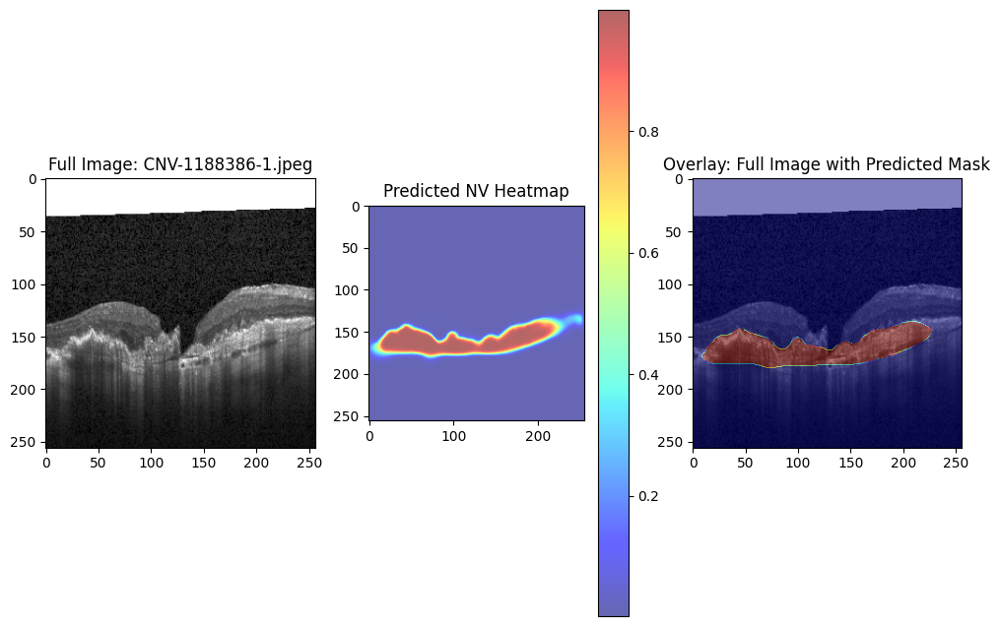

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


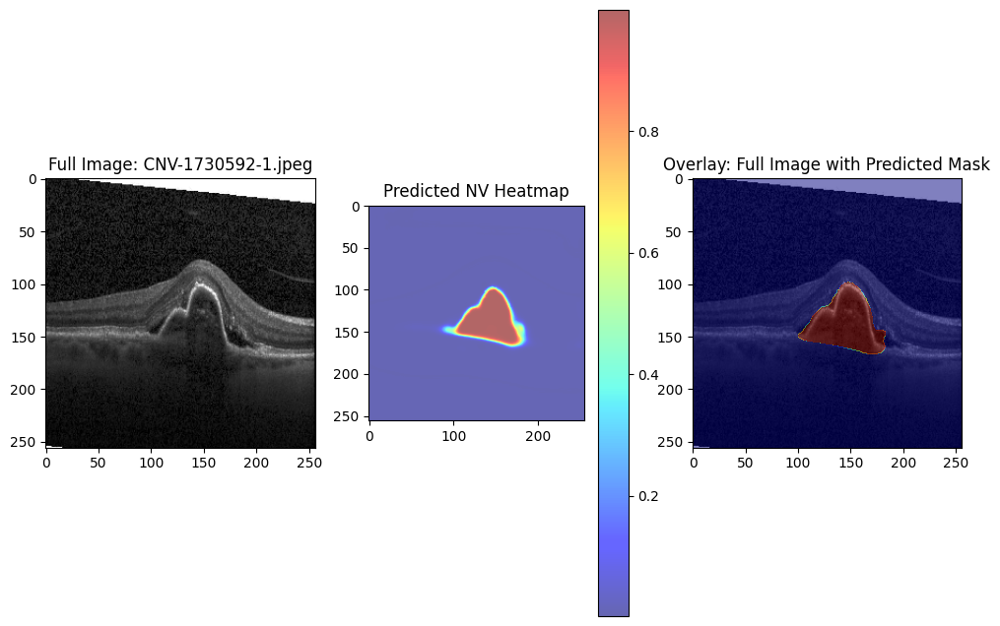

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


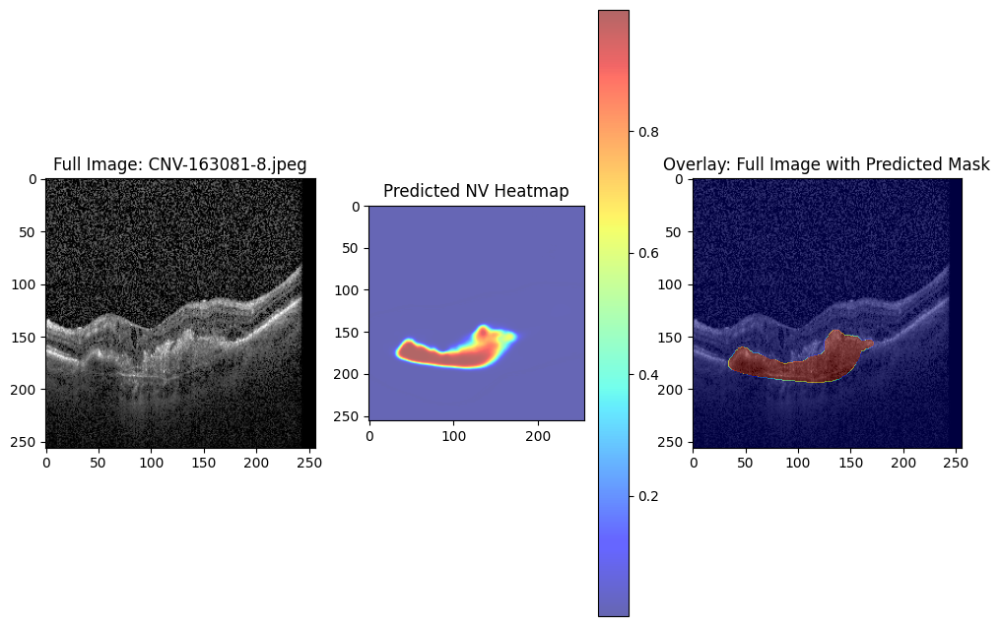

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


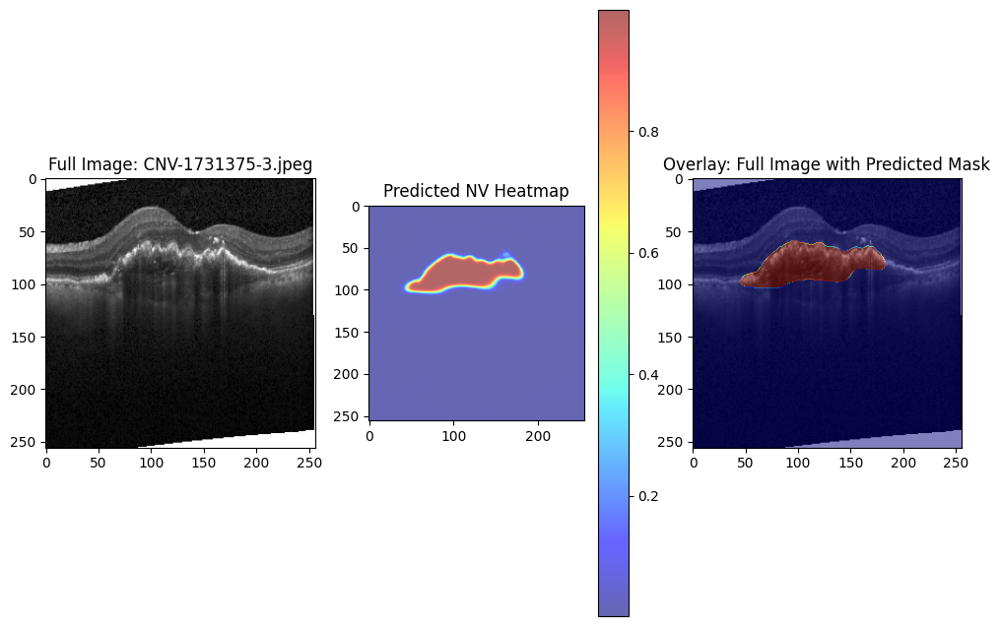

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


KeyboardInterrupt: 

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Load and preprocess the full image for prediction
def load_full_image(image_path, target_size=(256, 256)):
    full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
    full_image_array = img_to_array(full_image) / 255.0
    full_image_array = np.expand_dims(full_image_array, axis=0)
    return full_image_array

# Directory path containing the images to test
test_dir = '/content/drive/MyDrive/Working/val/CNV'

# Loop through all images in the directory
for image_filename in os.listdir(test_dir):
    if image_filename.endswith('.jpeg') or image_filename.endswith('.jpg') or image_filename.endswith('.png'):
        full_image_path = os.path.join(test_dir, image_filename)

        # Load and preprocess the image
        full_image = load_full_image(full_image_path)

        # Predict the mask for the full image
        predicted_mask = model.predict(full_image)[0, :, :, 0]  # Get the predicted mask

        # Apply threshold to the predicted mask for better visualization
        threshold = 0.5
        predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

        # Plot the original image and predicted mask
        plt.figure(figsize=(12, 8))

        # Display the original full image
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(full_image), cmap='gray')
        plt.title(f'Full Image: {image_filename}')

        # Display the predicted NV mask heatmap
        plt.subplot(1, 3, 2)
        plt.imshow(predicted_mask, cmap='jet', alpha=0.6)
        plt.title('Predicted NV Heatmap')
        plt.colorbar()

        # Overlay predicted mask on the full image
        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(full_image), cmap='gray')  # Original image
        plt.imshow(predicted_mask_binary, cmap='jet', alpha=0.5)  # Predicted mask overlay
        plt.title('Overlay: Full Image with Predicted Mask')

        # Show the plots
        plt.show()


In [76]:
# Save the trained U-Net model
model_save_path = '/content/drive/MyDrive/Working/models/attention_unet_model_62epoch_423.h5'
model.save(model_save_path)

print(f"Model saved to {model_save_path}")


Model saved to /content/drive/MyDrive/Working/models/attention_unet_model_62epoch_423.h5


In [87]:
# Save the model in the recommended Keras format (.keras)

model_path = '/content/drive/MyDrive/Working/models/attention_unet_model.keras'
model.save(model_path)

print(f"Model saved to {model_path}")



Model saved to /content/drive/MyDrive/Working/models/attention_unet_model.keras


# Evaluate the model

In [81]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from PIL import Image
from pycocotools import mask as maskUtils
import json

# Load the pretrained U-Net model
model_path = '/content/drive/MyDrive/Working/models/attention_unet_model_62epoch_423.h5'
unet_model = load_model(model_path)

# Load and preprocess the full image for prediction
def load_full_image(image_path, target_size=(256, 256)):
    full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
    full_image_array = img_to_array(full_image) / 255.0
    full_image_array = np.expand_dims(full_image_array, axis=0)  # Add batch dimension
    return full_image_array

# Function to handle both RLE and polygon segmentation formats in COCO
def segmentation_to_mask(segmentation, width, height):
    if isinstance(segmentation, dict):  # RLE format (compressed RLE)
        # print("Decoding RLE mask")
        rle = maskUtils.frPyObjects(segmentation, height, width)
        mask = maskUtils.decode(rle)
        return mask
    elif isinstance(segmentation, list):  # Polygon format
        # print("Processing polygon mask")
        mask = np.zeros((height, width), dtype=np.uint8)
        # Create a binary mask from polygons
        for polygon in segmentation:
            poly = np.array(polygon).reshape((-1, 2))
            img = Image.new('L', (width, height), 0)
            ImageDraw.Draw(img).polygon([tuple(p) for p in poly], outline=1, fill=1)
            mask = np.array(img, dtype=np.uint8)
        return mask
    else:
        raise TypeError("Unsupported segmentation format")

# Function to parse the COCO JSON file and return annotations
def parse_coco_json(json_file, image_dir):
    with open(json_file, 'r') as f:
        coco_data = json.load(f)

    annotations = []
    image_data = {}

    # Map image ID to file name and other metadata
    for img_info in coco_data['images']:
        image_data[img_info['id']] = {
            'file_name': img_info['file_name'],
            'width': img_info['width'],
            'height': img_info['height']
        }

    # Extract segmentation and mask information
    for ann in coco_data['annotations']:
        image_id = ann['image_id']
        image_info = image_data[image_id]
        image_filename = image_info['file_name']
        width = image_info['width']
        height = image_info['height']

        # Get the segmentation mask (COCO format supports RLE or polygons)
        mask = segmentation_to_mask(ann['segmentation'], width, height)

        annotations.append((image_filename, mask))

    return annotations

# Function to compute IoU (Intersection over Union)
def compute_iou(predicted_mask, ground_truth_mask):
    # Flatten masks to compute IoU on 1D arrays
    predicted_mask = predicted_mask.flatten()
    ground_truth_mask = ground_truth_mask.flatten()

    # Compute IoU
    intersection = np.sum(np.logical_and(predicted_mask, ground_truth_mask))
    union = np.sum(np.logical_or(predicted_mask, ground_truth_mask))
    iou = intersection / union if union != 0 else 0

    return iou

# Function to compute Dice coefficient
def compute_dice(predicted_mask, ground_truth_mask):
    # Flatten masks
    predicted_mask = predicted_mask.flatten()
    ground_truth_mask = ground_truth_mask.flatten()

    # Compute Dice Coefficient
    intersection = np.sum(np.logical_and(predicted_mask, ground_truth_mask))
    dice = (2. * intersection) / (np.sum(predicted_mask) + np.sum(ground_truth_mask))

    return dice

# Function to evaluate the model on each image and mask from COCO annotations
def evaluate_model_on_coco(test_dir, coco_json_file, threshold=0.5):
    iou_scores = []
    dice_scores = []
    annotations = parse_coco_json(coco_json_file, test_dir)
    counter = 0

    # Loop through all images and masks from COCO annotations
    for image_filename, ground_truth_mask in annotations:
        full_image_path = os.path.join(test_dir, image_filename)

        if not os.path.exists(full_image_path):
            # print(f"Image {image_filename} not found, skipping...")
            continue

        # Load and preprocess the image
        full_image = load_full_image(full_image_path)

        # Predict the mask for the full image
        predicted_mask = unet_model.predict(full_image)[0, :, :, 0]  # Extract the 2D mask

        # Apply threshold to convert the predicted mask to binary
        predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

        # Resize the ground truth mask to match the predicted mask size
        ground_truth_mask_resized = np.array(Image.fromarray(ground_truth_mask).resize((256, 256), Image.NEAREST))

        # Calculate IoU and Dice scores
        iou = compute_iou(predicted_mask_binary, ground_truth_mask_resized)
        dice = compute_dice(predicted_mask_binary, ground_truth_mask_resized)

        iou_scores.append(iou)
        dice_scores.append(dice)

        # Display evaluation results
        print(f"{image_filename}: IoU = {iou}, Dice Coefficient = {dice}")

        # Optionally plot every 10th result
        # Optionally plot every 10th result
        if counter % 10 == 0:
            plt.figure(figsize=(16, 8))  # Adjusting the figure size for four subplots

            # Subplot 1: Display the original full image
            plt.subplot(1, 4, 1)
            plt.imshow(np.squeeze(full_image), cmap='gray')
            plt.title(f'Full Image: {image_filename}')

            # Subplot 2: Display the predicted NV mask heatmap
            plt.subplot(1, 4, 2)
            plt.imshow(predicted_mask, cmap='jet', alpha=0.6)
            plt.title('Predicted NV Heatmap')
            plt.colorbar()

            # Subplot 3: Overlay predicted mask on the full image
            plt.subplot(1, 4, 3)
            plt.imshow(np.squeeze(full_image), cmap='gray')  # Original image
            plt.imshow(predicted_mask_binary, cmap='jet', alpha=0.5)  # Predicted mask overlay
            plt.title('Overlay: Full Image with Predicted Mask')

            # Subplot 4: Display the ground truth mask
            plt.subplot(1, 4, 4)
            plt.imshow(ground_truth_mask_resized, cmap='gray')
            plt.title('Ground Truth Mask')

            # Show the plots
            plt.show()


        counter += 1

    # Print average metrics
    print(f"Average IoU: {np.mean(iou_scores)}")
    print(f"Average Dice Coefficient: {np.mean(dice_scores)}")

# Paths to your dataset (Images and COCO annotations)
test_image_dir = '/content/drive/MyDrive/Working/train/CNV'
test_json_annotation_file = '/content/drive/MyDrive/Working/train/instances_default.json'  # COCO JSON file with annotations

# Run the evaluation
evaluate_model_on_coco(test_image_dir, test_json_annotation_file)


NotImplementedError: Exception encountered when calling Lambda.call().

[1mWe could not automatically infer the shape of the Lambda's output. Please specify the `output_shape` argument for this Lambda layer.[0m

Arguments received by Lambda.call():
  • args=('<KerasTensor shape=(None, 32, 32, 1), dtype=float32, sparse=False, name=keras_tensor_1479>',)
  • kwargs={'mask': 'None'}

In [95]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from PIL import Image
from pycocotools import mask as maskUtils
import json
import tensorflow as tf # Import tensorflow


model_path = '/content/drive/MyDrive/Working/models/attention_unet_model_62epoch_423.h5'
unet_model = tf.keras.models.load_model(model_path)

# Load and preprocess the full image for prediction
def load_full_image(image_path, target_size=(256, 256)):
    full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
    full_image_array = img_to_array(full_image) / 255.0
    full_image_array = np.expand_dims(full_image_array, axis=0)  # Add batch dimension
    return full_image_array

# Function to handle both RLE and polygon segmentation formats in COCO
def segmentation_to_mask(segmentation, width, height):
    if isinstance(segmentation, dict):  # RLE format (compressed RLE)
        print("Decoding RLE mask")
        rle = maskUtils.frPyObjects(segmentation, height, width)
        mask = maskUtils.decode(rle)
        return mask
    elif isinstance(segmentation, list):  # Polygon format
        print("Processing polygon mask")
        mask = np.zeros((height, width), dtype=np.uint8)
        # Create a binary mask from polygons
        for polygon in segmentation:
            poly = np.array(polygon).reshape((-1, 2))
            img = Image.new('L', (width, height), 0)
            ImageDraw.Draw(img).polygon([tuple(p) for p in poly], outline=1, fill=1)
            mask = np.array(img, dtype=np.uint8)
        return mask
    else:
        raise TypeError("Unsupported segmentation format")

# Function to parse the COCO JSON file and return annotations
def parse_coco_json(json_file, image_dir):
    with open(json_file, 'r') as f:
        coco_data = json.load(f)

    annotations = []
    image_data = {}

    # Map image ID to file name and other metadata
    for img_info in coco_data['images']:
        image_data[img_info['id']] = {
            'file_name': img_info['file_name'],
            'width': img_info['width'],
            'height': img_info['height']
        }

    # Extract segmentation and mask information
    for ann in coco_data['annotations']:
        image_id = ann['image_id']
        image_info = image_data[image_id]
        image_filename = image_info['file_name']
        width = image_info['width']
        height = image_info['height']

        # Get the segmentation mask (COCO format supports RLE or polygons)
        mask = segmentation_to_mask(ann['segmentation'], width, height)

        annotations.append((image_filename, mask))

    return annotations

# Function to evaluate if the predicted mask correctly matches the ground truth
def evaluate_prediction_accuracy(predicted_mask, ground_truth_mask, threshold=0.5):
    # Apply threshold to predicted mask
    predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

    # Check if predicted mask overlaps with ground truth (1 where predicted, 1 where ground truth)
    # Correct pixels = intersection of predicted and ground truth
    correct_pixels = np.sum(np.logical_and(predicted_mask_binary, ground_truth_mask))

    # Return 1 if there are any correct pixels, else 0
    return 1 if correct_pixels > 0 else 0

# Function to evaluate the model on each image and mask from COCO annotations
def evaluate_model_on_coco(test_dir, coco_json_file, threshold=0.5):
    total_images = 0
    total_correct = 0
    annotations = parse_coco_json(coco_json_file, test_dir)

    # Loop through all images and masks from COCO annotations
    for image_filename, ground_truth_mask in annotations:
        full_image_path = os.path.join(test_dir, image_filename)

        if not os.path.exists(full_image_path):
            print(f"Image {image_filename} not found, skipping...")
            continue

        # Load and preprocess the image
        full_image = load_full_image(full_image_path)

        # Predict the mask for the full image
        # predicted_mask = unet_model.predict(full_image)[0, :, :, 0]  # Extract the 2D mask

        predicted_mask = model.predict(full_image)[0, :, :, 0]  # Extract the 2D mask

        # Resize the ground truth mask to match the predicted mask size
        ground_truth_mask_resized = np.array(Image.fromarray(ground_truth_mask).resize((256, 256), Image.NEAREST))

        # Evaluate the prediction correctness
        is_correct = evaluate_prediction_accuracy(predicted_mask, ground_truth_mask_resized, threshold)

        total_images += 1
        total_correct += is_correct

        # Display evaluation results
        print(f"{image_filename}: Prediction Correct: {is_correct}")

    # Print final accuracy
    accuracy = total_correct / total_images if total_images > 0 else 0
    print(f"Total Correct: {total_correct}/{total_images}")
    print(f"Accuracy: {accuracy * 100:.2f}%")

# Paths to your dataset (Images and COCO annotations)
test_image_dir = '/content/drive/MyDrive/Working/train/CNV'
test_json_annotation_file = '/content/drive/MyDrive/Working/train/instances_default.json'  # COCO JSON file with annotations

# Run the evaluation
evaluate_model_on_coco(test_image_dir, test_json_annotation_file)


NotImplementedError: Exception encountered when calling Lambda.call().

[1mWe could not automatically infer the shape of the Lambda's output. Please specify the `output_shape` argument for this Lambda layer.[0m

Arguments received by Lambda.call():
  • args=('<KerasTensor shape=(None, 32, 32, 1), dtype=float32, sparse=False, name=keras_tensor_2037>',)
  • kwargs={'mask': 'None'}

In [94]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from PIL import Image, UnidentifiedImageError
import json

# Load the pretrained U-Net model
# model_path = '/content/drive/MyDrive/Working/models/unet_model_62epoch_423.h5'
# unet_model = load_model(model_path)

# Load and preprocess the full image for prediction
def load_full_image(image_path, target_size=(256, 256)):
    try:
        full_image = load_img(image_path, color_mode='grayscale', target_size=target_size)
        full_image_array = img_to_array(full_image) / 255.0
        full_image_array = np.expand_dims(full_image_array, axis=0)  # Add batch dimension
        return full_image_array
    except UnidentifiedImageError:
        print(f"Cannot identify image file: {image_path}. Skipping.")
        return None  # Return None if image cannot be loaded

# Function to evaluate the model's prediction for normal images (no NV expected)
def evaluate_normal_image_prediction(predicted_mask, threshold=0.5):
    # Apply threshold to predicted mask
    predicted_mask_binary = (predicted_mask > threshold).astype(np.uint8)

    # If any positive pixels are detected, mark it as incorrect
    if np.sum(predicted_mask_binary) > 0:
        return 0  # Incorrect, since NV was detected in a normal image
    else:
        return 1  # Correct, since no NV was detected in a normal image

# Function to evaluate the model on normal images (no ground truth mask available)
def evaluate_model_on_normal_images(test_dir, threshold=0.5):
    total_images = 0
    total_correct = 0

    # Loop through all images in the directory
    for image_filename in os.listdir(test_dir):
        if image_filename.endswith('.jpeg') or image_filename.endswith('.jpg') or image_filename.endswith('.png'):
            full_image_path = os.path.join(test_dir, image_filename)

            # Load and preprocess the image
            full_image = load_full_image(full_image_path)

            if full_image is None:
                continue  # Skip if image couldn't be loaded

            # Predict the mask for the full image
            predicted_mask = model.predict(full_image)[0, :, :, 0]  # Extract the 2D mask

            # Evaluate the prediction for a normal image
            is_correct = evaluate_normal_image_prediction(predicted_mask, threshold)

            total_images += 1
            total_correct += is_correct

            # Display evaluation results
            print(f"{image_filename}: Prediction Correct: {is_correct}")

    # Print final accuracy
    accuracy = total_correct / total_images if total_images > 0 else 0
    print(f"Total Correct: {total_correct}/{total_images}")
    print(f"Accuracy: {accuracy * 100:.2f}%")

# Paths to your dataset (Normal images without ground truth masks)
test_image_dir = '/content/drive/MyDrive/Working/train/NORMAL'  # Directory for normal images (no NV expected)

# Run the evaluation for normal images
evaluate_model_on_normal_images(test_image_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
NORMAL-100580-2.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
NORMAL-100580-6.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
NORMAL-101880-9.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
NORMAL-101880-4.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
NORMAL-101880-2.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
NORMAL-100580-1.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
NORMAL-101880-6.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
NORMAL-101880-7.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
NORMAL-100580-5.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
NORMAL-101880-3.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
NORMAL-100580-4.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
NORMAL-100580-3.jpeg: Prediction Correct: 1
1/1 ━━━━━━━━━━━